<a href="https://colab.research.google.com/github/kevkerok17/Seismic-Facies/blob/main/Clasificacion_de_Facies_Sismicas_Supervisado_ML.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importacion de Sismica

In [ ]:
!pip install segyio
import segyio
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn import preprocessing
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
import pandas as pd

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.1/85.1 kB 2.8 MB/s eta 0:00:00


In [ ]:
# Cargar el volumen
filenamecubo = ('/content/drive/MyDrive/Datos/Amistad2.sgy')
with segyio.open(filenamecubo) as b:
    cubo3d = segyio.cube(b)

# Cargar el atributo LSD
filename = ('/content/drive/MyDrive/Datos/LSD.sgy')
with segyio.open(filename) as a:
    lsd = segyio.cube(a)

# Cargar el atributo Variance

with segyio.open('/content/drive/MyDrive/Datos/Variance') as a:
    var = segyio.cube(a)

# Cargar el atributo Reflection Intesity

with segyio.open('/content/drive/MyDrive/Datos/Reflection Intensity') as a:
    ri = segyio.cube(a)

# Cargar el atributo GLCM

with segyio.open('/content/drive/MyDrive/Datos/GLCM I') as a:
    glcm = segyio.cube(a)


# Cargar el atributo Chaos

with segyio.open('/content/drive/MyDrive/Datos/Chaos') as a:
    chaos = segyio.cube(a)

# Cargar el atributo Envelope

with segyio.open('/content/drive/MyDrive/Datos/Envelope') as a:
    envelope = segyio.cube(a)

# Cargar el atributo Chaos

with segyio.open('/content/drive/MyDrive/Datos/Chaos') as a:
    chaos = segyio.cube(a)


In [ ]:
#Cubo Entero
#with segyio.open('/content/drive/MyDrive/Datos/Amistad.sgy') as a:
 #   cubo = segyio.cube(a)

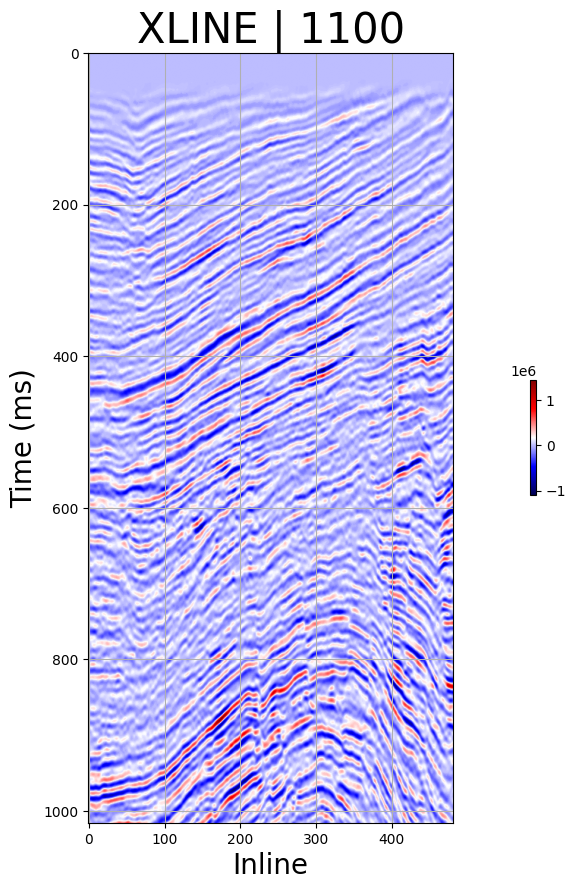

In [ ]:
plt.figure(figsize = (20, 10))
plt.imshow(cubo3d[:,10,:].T, cmap = 'seismic')
plt.grid(True)
plt.xlabel('Inline', fontsize = 20)
plt.ylabel('Time (ms)', fontsize = 20)
plt.title('XLINE | 1100', fontsize = 30)
plt.colorbar(shrink=0.15)

El percentile 98 de la amplitude sismica es:  369876.72


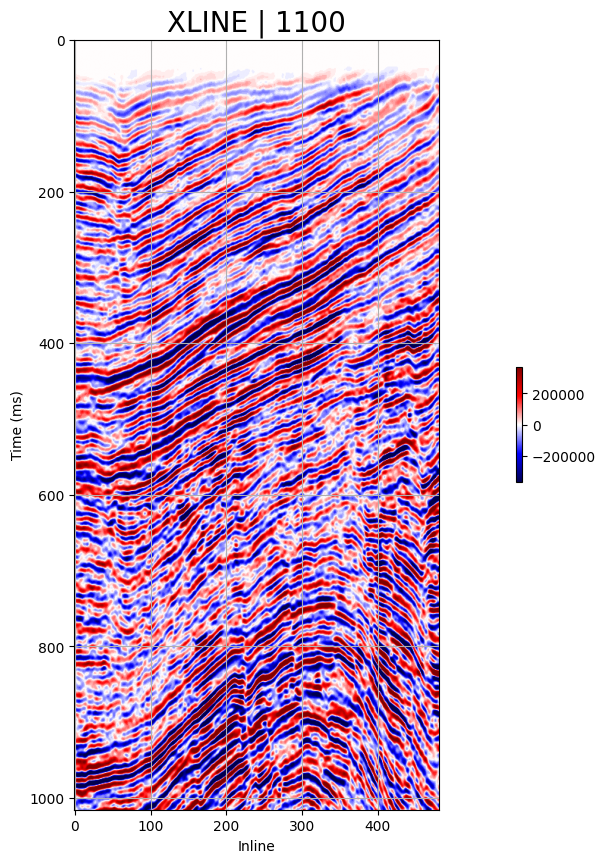

In [ ]:
amplitude_max = np.percentile(cubo3d, 98)
print('El percentile 98 de la amplitude sismica es: ', amplitude_max)
plt.figure(figsize = (20, 10))
plt.imshow(cubo3d[:,10, :].T, cmap = 'seismic', vmax = amplitude_max, vmin = -amplitude_max)
plt.grid(True)
plt.xlabel('Inline', fontsize = 10)
plt.ylabel('Time (ms)', fontsize = 10)
plt.title('XLINE | 1100', fontsize = 20)
plt.colorbar(shrink=0.15,)
plt.savefig('XLINE 1100')

In [ ]:
#Detalles Cubo de Atributos
print("Cantidad de INLINE's: ", lsd.shape[0])
print("Cantidad de XLINE's: ", lsd.shape[1])
print("Cantidad de TIMESLICES's: ", lsd.shape[2])

Cantidad de INLINE's:  481
Cantidad de XLINE's:  21
Cantidad de TIMESLICES's:  1016


El percentile 98 de la amplitude sismica es:  369876.72


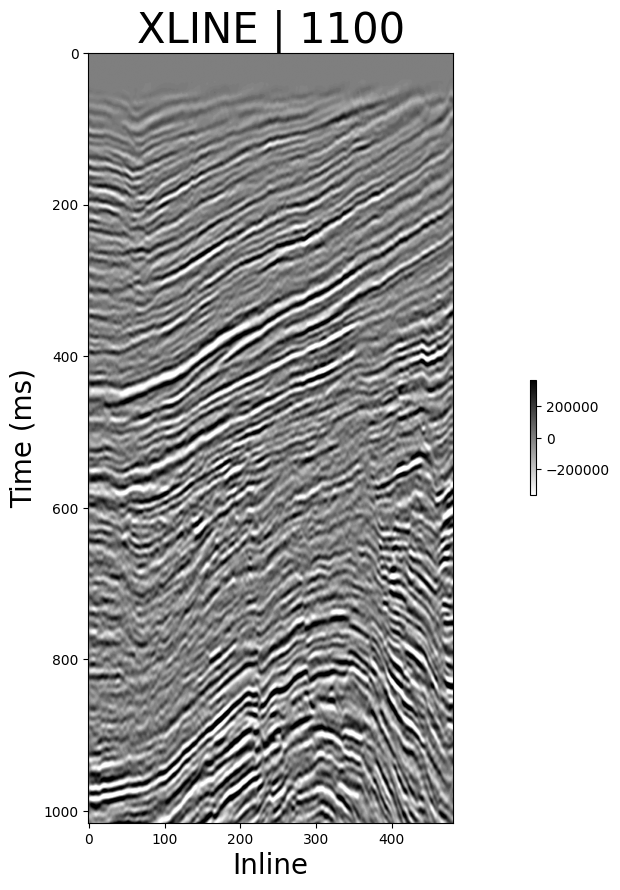

In [ ]:
amplitude_max = np.percentile(cubo3d, 98)
print('El percentile 98 de la amplitude sismica es: ', amplitude_max)
plt.figure(figsize = (20, 10))
plt.imshow(cubo3d[:,10, :].T, cmap = 'gray_r', vmax = amplitude_max, vmin = -amplitude_max)
plt.grid(False)
plt.xlabel('Inline', fontsize = 20)
plt.ylabel('Time (ms)', fontsize = 20)
plt.title('XLINE | 1100', fontsize = 30)
plt.colorbar(shrink=0.15)
plt.savefig('XLINE 1100')

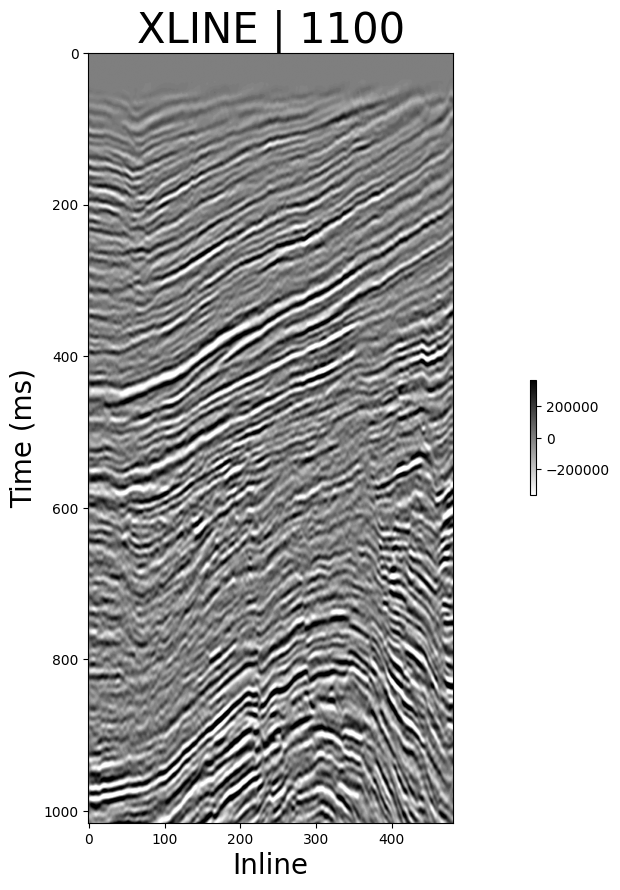

In [ ]:
plt.figure(figsize = (20, 10))
plt.imshow(cubo3d[:,10, :].T, cmap = 'gray_r', vmax = amplitude_max, vmin = -amplitude_max)
plt.grid(False)
plt.xlabel('Inline', fontsize = 20)
plt.ylabel('Time (ms)', fontsize = 20)
plt.title('XLINE | 1100', fontsize = 30)
plt.colorbar(shrink=0.15)

In [ ]:
# Vamos a elegir un valor de buzamiento maximo equivalente a un % (o percentile) de mis datos

dip_max = float(np.percentile(lsd, 99))
print('El percentile 98 de la buzamiento en la sismica es: ', dip_max)

El percentile 98 de la buzamiento en la sismica es:  81.74835968017578


El percentile 98 de la buzamiento en la sismica es:  81.74835968017578


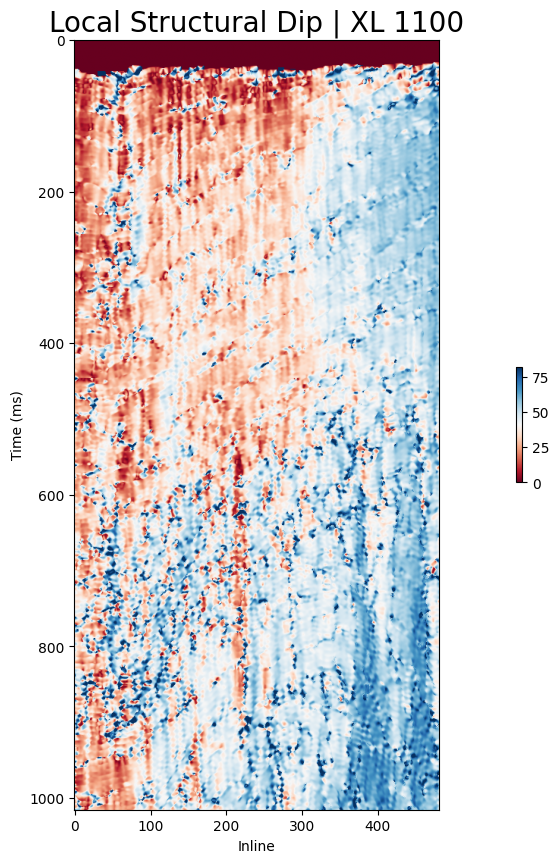

In [ ]:
# Vamos a elegir un valor de buzamiento maximo equivalente a un % (o percentile) de mis datos

dip_max = float(np.percentile(lsd, 99))
print('El percentile 98 de la buzamiento en la sismica es: ', dip_max)
plt.figure(figsize = (20, 10))
plt.imshow(lsd[:,11, :].T, cmap = 'RdBu', vmax = dip_max, vmin = 0)
plt.xlabel('Inline', fontsize = 10)
plt.ylabel('Time (ms)', fontsize = 10)
plt.title('Local Structural Dip | XL 1100', fontsize = 20)
plt.colorbar(shrink=0.15)

El percentile 98 de la varianza en la sismica es:  0.6178396


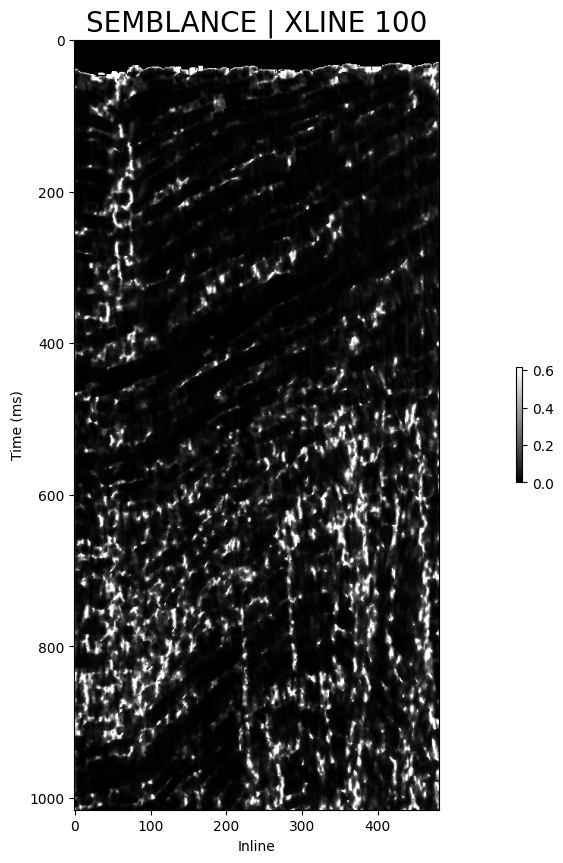

In [ ]:
# Elegimos un valor de variance maximo equivalente a un % (o percentile) de mis datos
var_max = np.percentile(var, 98)
print('El percentile 98 de la varianza en la sismica es: ', var_max)

plt.figure(figsize = (20, 10))
plt.imshow(var[:,11, :].T, cmap = 'gray', vmax = var_max, vmin = 0)
plt.xlabel('Inline', fontsize = 10)
plt.ylabel('Time (ms)', fontsize = 10)
plt.title('SEMBLANCE | XLINE 100', fontsize = 20)
plt.colorbar(shrink=0.15)

El percentile 98 de la varianza en la sismica es:  628.63824


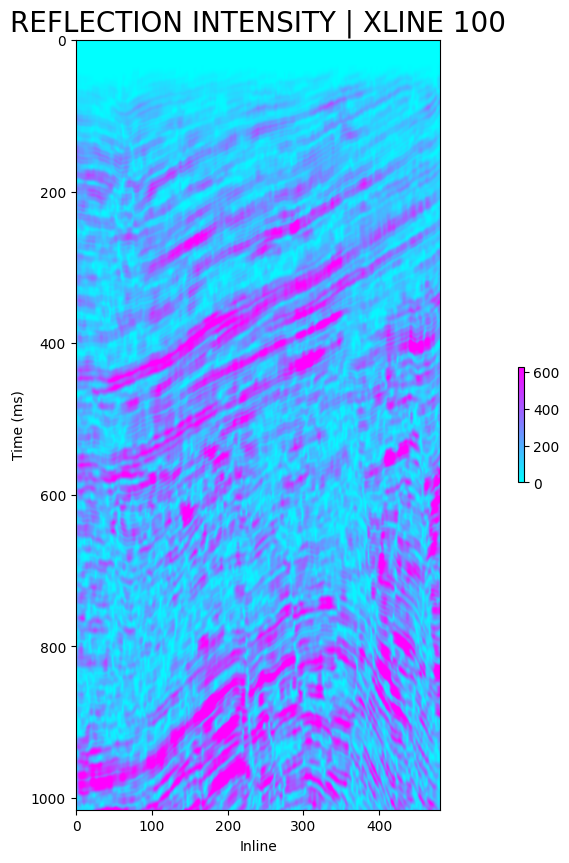

In [ ]:
#REFLECTION INTENSITY
# Elegimos un valor de variance maximo equivalente a un % (o percentile) de mis datos
ri_max = np.percentile(ri, 98)
print('El percentile 98 de la varianza en la sismica es: ', ri_max)

plt.figure(figsize = (20, 10))
plt.imshow(ri[:,11, :].T, cmap = 'cool',vmax = ri_max, vmin = 0)
plt.xlabel('Inline', fontsize = 10)
plt.ylabel('Time (ms)', fontsize = 10)
plt.title('REFLECTION INTENSITY | XLINE 100', fontsize = 20)
plt.colorbar(shrink=0.15)

El percentile 98 de la varianza en la sismica es:  631601.56


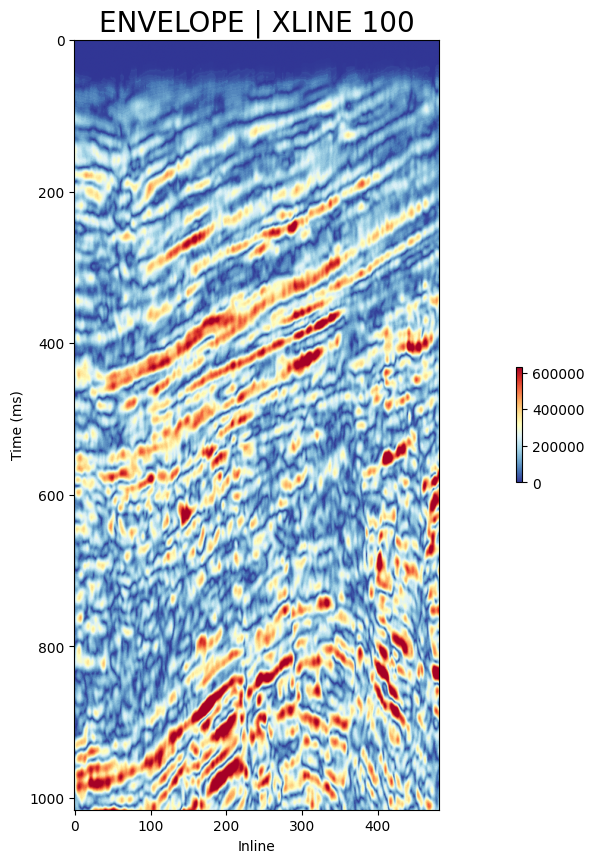

In [ ]:
#ENVELOPE
# Elegimos un valor de variance maximo equivalente a un % (o percentile) de mis datos
envelope_max = np.percentile(envelope, 99)
print('El percentile 98 de la varianza en la sismica es: ', envelope_max)

plt.figure(figsize = (20, 10))
plt.imshow(envelope[:,11, :].T, cmap = 'RdYlBu_r',vmax = envelope_max, vmin = 0)
plt.xlabel('Inline', fontsize = 10)
plt.ylabel('Time (ms)', fontsize = 10)
plt.title('ENVELOPE | XLINE 100', fontsize = 20)
plt.colorbar(shrink=0.15)

El percentile 98 de la varianza en la sismica es:  1.0


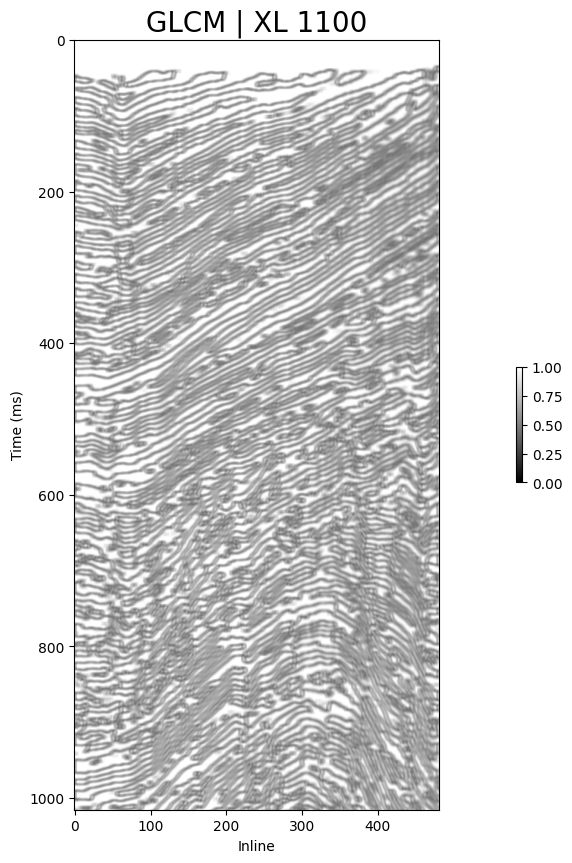

In [ ]:
#GLCM
# Elegimos un valor de variance maximo equivalente a un % (o percentile) de mis datos
glcm_max = np.percentile(glcm, 98)
print('El percentile 98 de la varianza en la sismica es: ', glcm_max)

plt.figure(figsize = (20, 10))
plt.imshow(glcm[:,11, :].T, cmap = 'binary_r',vmax = glcm_max, vmin = 0)
plt.xlabel('Inline', fontsize = 10)
plt.ylabel('Time (ms)', fontsize = 10)
plt.title('GLCM | XL 1100', fontsize = 20)
plt.colorbar(shrink=0.15)

El percentile 98 de la varianza en la sismica es:  0.6099697


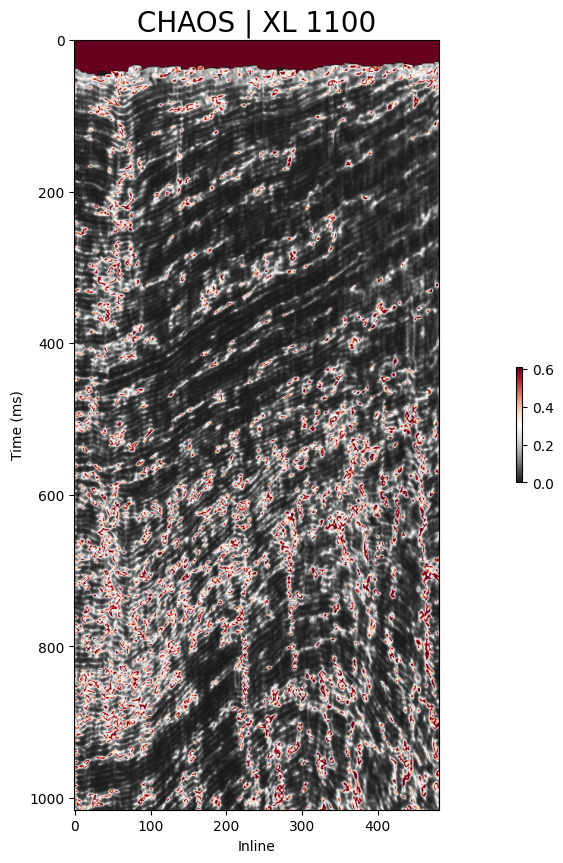

In [ ]:
#CHAOS
# Elegimos un valor de variance maximo equivalente a un % (o percentile) de mis datos
chaos_max = np.percentile(chaos, 95)
print('El percentile 98 de la varianza en la sismica es: ', chaos_max)

plt.figure(figsize = (20, 10))
plt.imshow(chaos[:,11, :].T, cmap = 'RdGy_r',vmax = chaos_max, vmin = 0)
plt.xlabel('Inline', fontsize = 10)
plt.ylabel('Time (ms)', fontsize = 10)
plt.title('CHAOS | XL 1100', fontsize = 20)
plt.colorbar(shrink=0.15)

Window 10 x 10

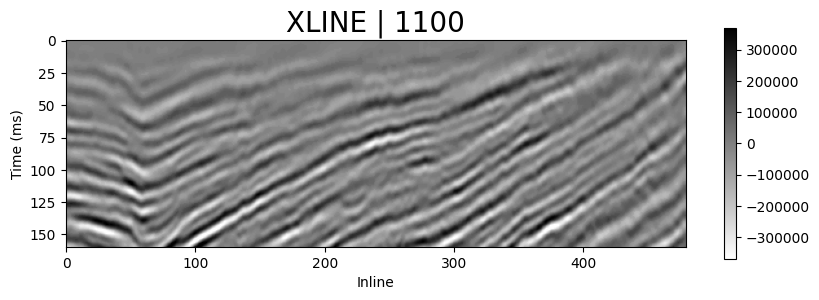

In [ ]:
plt.figure(figsize = (10,20))
plt.imshow(cubo3d[:480,1, 40:200].T, cmap = 'gray_r', vmax = amplitude_max, vmin = -amplitude_max)
plt.grid
plt.xlabel('Inline', fontsize = 10)
plt.ylabel('Time (ms)', fontsize = 10)
plt.title('XLINE | 1100', fontsize = 20)
plt.colorbar(shrink=0.15)

ValueError: keyword grid_b is not recognized; valid keywords are ['size', 'width', 'color', 'tickdir', 'pad', 'labelsize', 'labelcolor', 'labelfontfamily', 'zorder', 'gridOn', 'tick1On', 'tick2On', 'label1On', 'label2On', 'length', 'direction', 'left', 'bottom', 'right', 'top', 'labelleft', 'labelbottom', 'labelright', 'labeltop', 'labelrotation', 'grid_agg_filter', 'grid_alpha', 'grid_animated', 'grid_antialiased', 'grid_clip_box', 'grid_clip_on', 'grid_clip_path', 'grid_color', 'grid_dash_capstyle', 'grid_dash_joinstyle', 'grid_dashes', 'grid_data', 'grid_drawstyle', 'grid_figure', 'grid_fillstyle', 'grid_gapcolor', 'grid_gid', 'grid_in_layout', 'grid_label', 'grid_linestyle', 'grid_linewidth', 'grid_marker', 'grid_markeredgecolor', 'grid_markeredgewidth', 'grid_markerfacecolor', 'grid_markerfacecoloralt', 'grid_markersize', 'grid_markevery', 'grid_mouseover', 'grid_path_effects', 'grid_picker', 'grid_pickradius', 'grid_rasterized', 'grid_sketch_params', 'grid_snap', 'grid_solid_capstyle', 'grid_solid_joinstyle', 'grid_transform', 'grid_url', 'grid_visible', 'grid_xdata', 'grid_ydata', 'grid_zorder', 'grid_aa', 'grid_c', 'grid_ds', 'grid_ls', 'grid_lw', 'grid_mec', 'grid_mew', 'grid_mfc', 'grid_mfcalt', 'grid_ms']

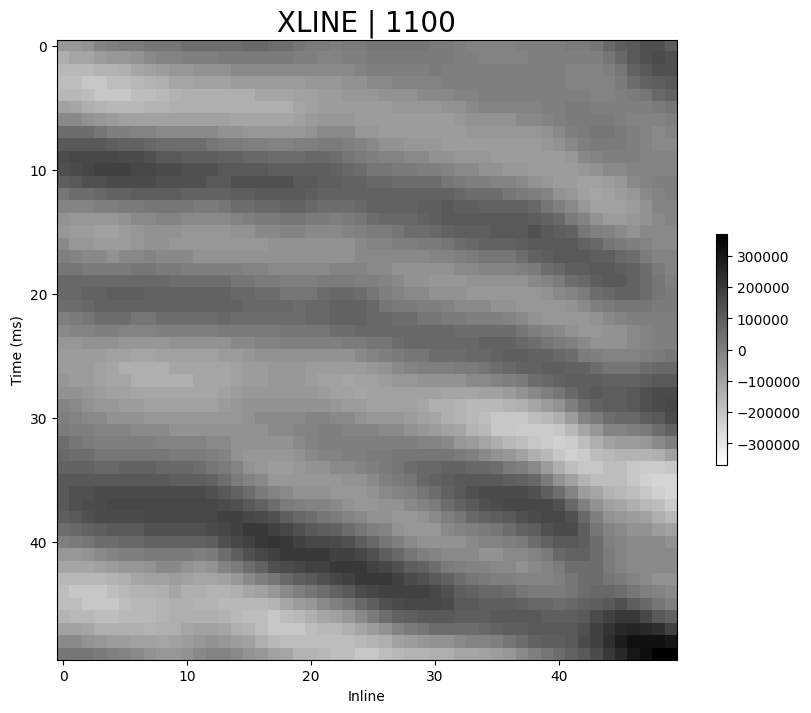

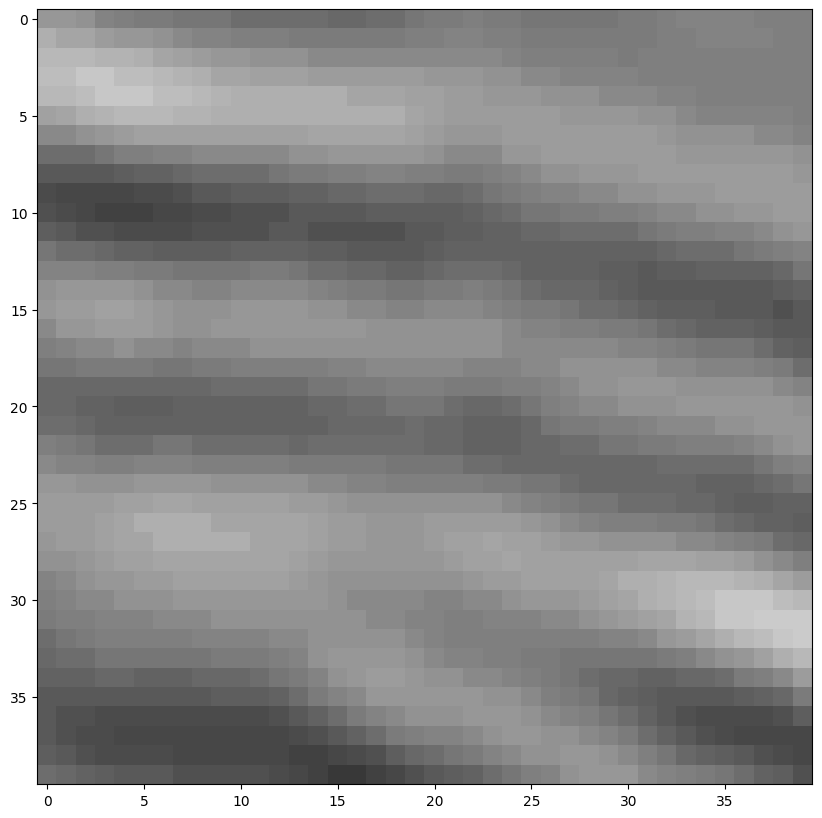

In [ ]:
plt.figure(figsize = (10,20))
plt.imshow(cubo3d[:50,1, 100:150].T, cmap = 'gray_r', vmax = amplitude_max, vmin = -amplitude_max)
plt.xlabel('Inline', fontsize = 10)
plt.ylabel('Time (ms)', fontsize = 10)
plt.title('XLINE | 1100', fontsize = 20)
plt.colorbar(shrink=0.15)

plt.figure(figsize = (10,20))
plt.imshow(cubo3d[:40,1, 100:140].T, cmap = 'gray_r', vmax = amplitude_max, vmin = -amplitude_max)
plt.grid(b=False)
plt.xlabel('Inline', fontsize = 10)
plt.ylabel('Time (ms)', fontsize = 10)
#plt.title('XLINE | 1100', fontsize = 20)
plt.colorbar(shrink=0.15)

plt.figure(figsize = (10,20))
plt.imshow(cubo3d[:40,1, 100:140].T, cmap = 'seismic', vmax = amplitude_max, vmin = -amplitude_max)
plt.grid(b=False)
plt.xlabel('Inline', fontsize = 10)
plt.ylabel('Time (ms)', fontsize = 10)
#plt.title('XLINE | 1100', fontsize = 20)
plt.colorbar(shrink=0.15)

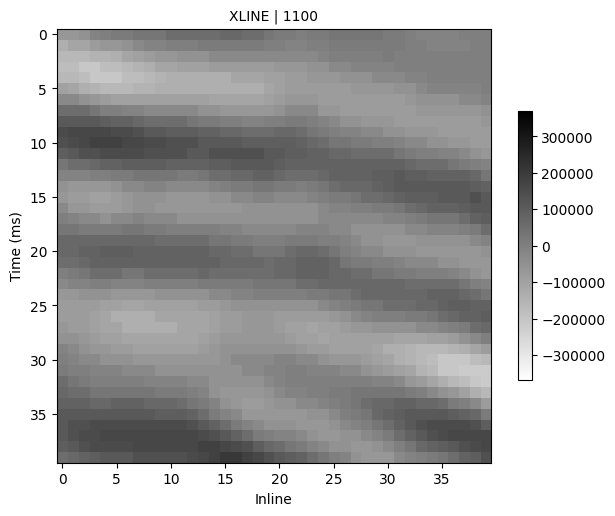

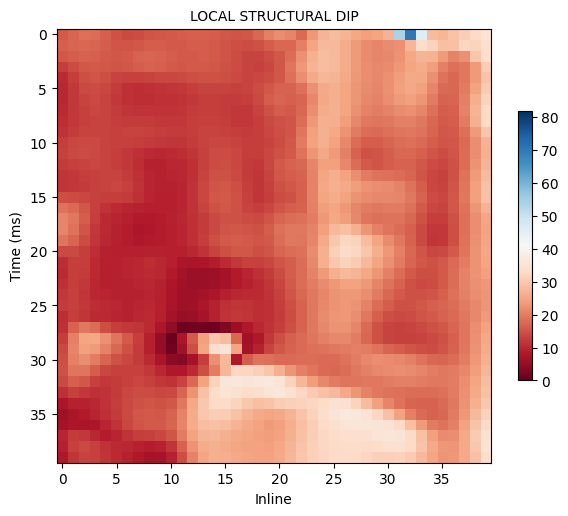

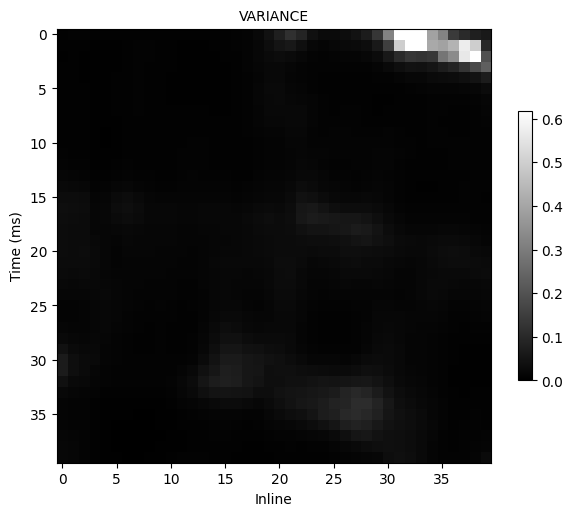

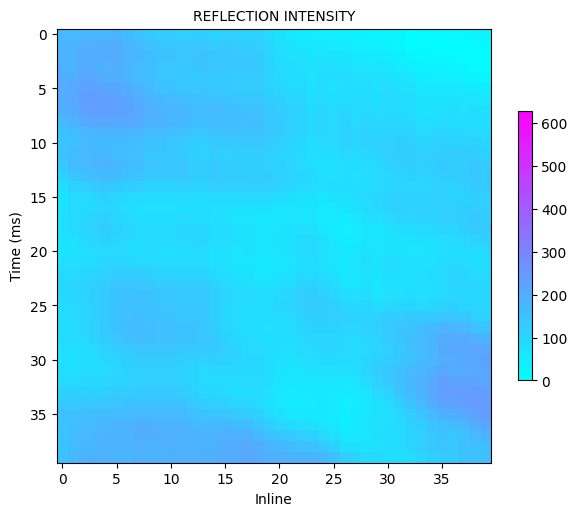

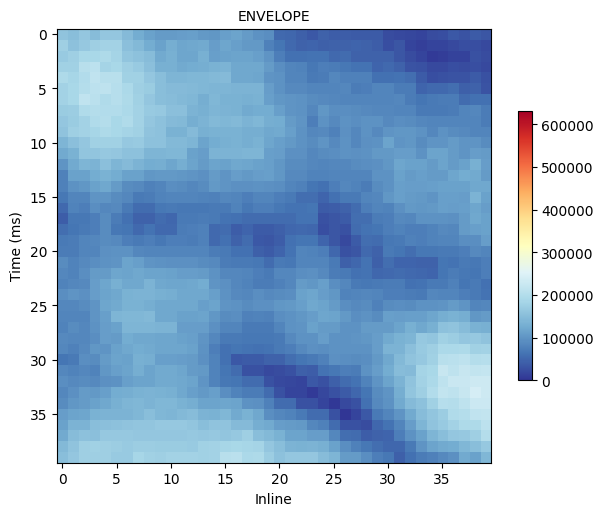

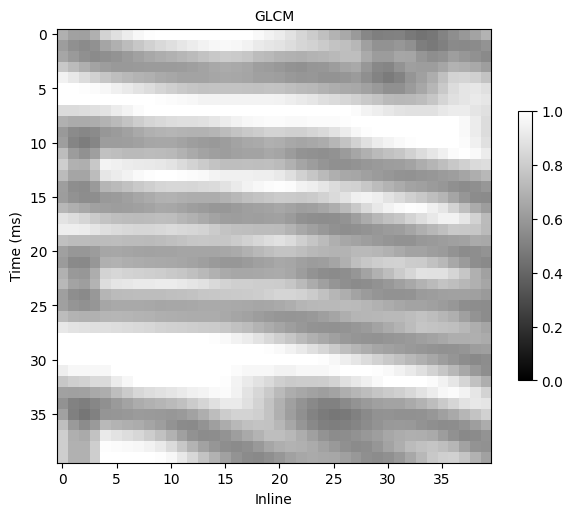

In [ ]:
plt.figure(figsize = (7,7))
plt.imshow(cubo3d[:40,1, 100:140].T, cmap = 'gray_r' ,vmax = amplitude_max, vmin = -amplitude_max)
plt.grid(False)
plt.xlabel('Inline', fontsize = 10)
plt.ylabel('Time (ms)', fontsize = 10)
plt.title('XLINE | 1100', fontsize = 10)
plt.colorbar(shrink=0.5)

plt.figure(figsize = (7,7))
plt.imshow(lsd[:40,1, 100:140].T, cmap = 'RdBu', vmax = dip_max, vmin = 0)
plt.grid(False)
plt.xlabel('Inline', fontsize = 10)
plt.ylabel('Time (ms)', fontsize = 10)
plt.title('LOCAL STRUCTURAL DIP', fontsize = 10)
plt.colorbar(shrink=0.5)

plt.figure(figsize = (7,7))
plt.imshow(var[:40,1, 100:140].T, cmap = 'gray', vmax = var_max, vmin = 0)
plt.grid(False)
plt.xlabel('Inline', fontsize = 10)
plt.ylabel('Time (ms)', fontsize = 10)
plt.title('VARIANCE', fontsize =10)
plt.colorbar(shrink=0.5)


plt.figure(figsize = (7,7))
plt.imshow(ri[:40,1, 100:140].T, cmap = 'cool',vmax = ri_max, vmin = 0)
plt.grid(False)
plt.xlabel('Inline', fontsize = 10)
plt.ylabel('Time (ms)', fontsize = 10)
plt.title('REFLECTION INTENSITY', fontsize = 10)
plt.colorbar(shrink=0.5)


plt.figure(figsize = (7,7))
plt.imshow(envelope[:40,1, 100:140].T, cmap = 'RdYlBu_r',vmax = envelope_max, vmin = 0)
plt.grid(False)
plt.xlabel('Inline', fontsize = 10)
plt.ylabel('Time (ms)', fontsize = 10)
plt.title('ENVELOPE', fontsize = 10)
plt.colorbar(shrink=0.5)


plt.figure(figsize = (7, 7))
plt.imshow(glcm[:40,1, 100:140].T, cmap = 'binary_r',vmax = glcm_max, vmin = 0)
plt.grid(False)
plt.xlabel('Inline', fontsize = 10)
plt.ylabel('Time (ms)', fontsize = 10)
plt.title('GLCM', fontsize = 10)
plt.colorbar(shrink=0.5)

In [ ]:
print(np.percentile(var[0:20,1,100:120],80))

0.016355973


In [ ]:
print(lsd[:50,1, 100:150])

[[15.863935 16.303425 15.552139 ...  6.415979  9.42326  12.63108 ]
 [17.192614 17.017748 16.233912 ...  7.649521  9.19842  11.599003]
 [18.338104 17.514067 16.666567 ...  9.263652  9.896706 11.484662]
 ...
 [44.122234 45.16616  45.322826 ... 28.520203 31.852146 34.201572]
 [43.02175  43.139954 42.717686 ... 29.16357  31.166788 33.3658  ]
 [42.72022  42.32928  41.48591  ... 29.900436 31.257168 32.886032]]


In [ ]:
p20A=np.percentile(lsd[:50,1, 100:150], 20)
p50A=np.percentile(lsd[:50,1, 100:150], 50)
p80A=np.percentile(lsd[:50,1, 100:150], 80)
deA=np.std(lsd[:50,1, 100:150])
print('Percentil 20 es:',p20A)
print('Percentil 50 es:',p50A)
print('Percentil 80 es:',p80A)
print('Desviacion estandar es:',deA)

Percentil 20 es: 12.466672
Percentil 50 es: 19.401924
Percentil 80 es: 28.962595
Desviacion estandar es: 10.211345


# Extracción de Características

# Atributo Local Structural Dip

In [ ]:
lsd.shape

(481, 21, 1016)

In [ ]:
###Definimos tamaño de la ventana
m=20       ##largo
n=20       ##ancho

In [ ]:
#Local Structural Dip --- Promedio
LSD_Mean=[]
for j in np.arange(0,1000,m):
    for i in np.arange(0,480,n):
        LSD_Mean.append(np.mean(lsd[i:i+n,11,j:j+m]))
        print(np.mean(lsd[i:i+n,1,j:j+m]))
    print()
LSD_Mean=np.array(LSD_Mean)
LSD_Mean.shape=(50,24)
LSD_Mean

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

6.200398
0.0
1.583584
4.486502
7.095829
5.1897545
6.322876
1.3632971
1.0848517
2.1867764
3.4342782
9.452758
2.0282993
7.038251
7.8123555
3.6374252
11.9164095
22.430513
13.234358
12.1920595
15.225537
12.840784
5.540213
19.3584

26.191635
22.680777
43.794464
39.130733
32.701168
19.203585
24.752827
44.902557
24.828901
28.933788
27.98938
39.877254
33.484875
40.296577
30.317636
29.950346
57.163876
44.050957
49.425068
40.61369
41.117542
44.771988
55.88873
46.717167

14.066799
24.34928
41.586548
22.071167
32.07569
19.697784
12.635467
19.32862
25.001213
13.2497835
16.498587
24.740732
23.481342
20.211006
29.352684
31.890121
33.892498
39.135166
35.668953
44.041183
45.95755
51.41077
59.05714
55.211903

21.795425
39.269047
38.742767
25.873926
26.22102
20.788523
20.39043
41.99354
34.265125
27.541853
28.151619
22.680218
16.824707
22.994986
28.622515
34.949448
37.074642
44.724796
48.21305
50.960983
52.353

array([[ 0.      ,  0.      ,  0.      , ...,  0.      ,  0.      ,
         0.      ],
       [ 1.272335,  0.      ,  0.      , ..., 18.474947,  9.800384,
        24.443132],
       [17.962837, 30.750582, 42.019875, ..., 33.694984, 42.83095 ,
        56.5404  ],
       ...,
       [37.353775, 28.715908, 26.064775, ..., 59.870243, 66.43488 ,
        61.32211 ],
       [23.563581, 23.019926, 21.348904, ..., 62.850674, 65.42099 ,
        65.59313 ],
       [31.928082, 30.028664, 26.180813, ..., 54.079945, 65.4316  ,
        60.4427  ]], dtype=float32)

In [ ]:
print(np.mean(lsd[460:480,1,960:980]))

65.673615


In [ ]:
#Local Structural Dip --- Percentil 20
LSD_P20=[]
for j in np.arange(0,1000,m):
    for i in np.arange(0,480,n):
        LSD_P20.append(np.percentile(lsd[i:i+n,11,j:j+m],20))
        #print(np.mean(lsd[i:i+n,1,j:j+m]))
    #print()
LSD_P20=np.array(LSD_P20)
LSD_P20.shape=(50,24)
LSD_P20

array([[ 0.       ,  0.       ,  0.       , ...,  0.       ,  0.       ,
         0.       ],
       [ 0.       ,  0.       ,  0.       , ...,  0.       ,  0.       ,
         0.       ],
       [ 5.8378625,  2.9639213, 18.9467   , ..., 26.45421  , 24.78439  ,
        38.768364 ],
       ...,
       [25.756971 , 24.04627  , 14.963922 , ..., 52.46608  , 59.78684  ,
        51.83405  ],
       [14.130318 , 20.764704 , 17.600155 , ..., 56.880604 , 60.01021  ,
        57.57562  ],
       [18.544876 , 23.225693 , 19.384115 , ..., 48.815575 , 60.72303  ,
        54.583607 ]], dtype=float32)

In [ ]:
#Local Structural Dip --- Percentil 80
LSD_P80=[]
for j in np.arange(0,1000,m):
    for i in np.arange(0,480,n):
        LSD_P80.append(np.percentile(lsd[i:i+n,11,j:j+m],80))
LSD_P80=np.array(LSD_P80)
LSD_P80.shape=(50,24)
LSD_P80

array([[ 0.      ,  0.      ,  0.      , ...,  0.      ,  0.      ,
         0.      ],
       [ 0.      ,  0.      ,  0.      , ..., 49.181576, 19.634298,
        56.169594],
       [32.007725, 53.288948, 70.50194 , ..., 41.692482, 60.285866,
        76.395195],
       ...,
       [46.87535 , 31.984268, 31.499653, ..., 68.41084 , 71.78938 ,
        69.70302 ],
       [32.59302 , 25.059145, 25.668217, ..., 67.85785 , 70.28287 ,
        74.60999 ],
       [42.05802 , 32.83559 , 29.363522, ..., 57.566395, 69.74418 ,
        65.43364 ]], dtype=float32)

In [ ]:
#Local Structural Dip --- DE
LSD_DE=[]
for j in np.arange(0,1000,m):
    for i in np.arange(0,480,n):
        LSD_DE.append(np.std(lsd[i:i+n,11,j:j+m]))
LSD_DE=np.array(LSD_DE)
LSD_DE.shape=(50,24)
LSD_DE

array([[ 0.       ,  0.       ,  0.       , ...,  0.       ,  0.       ,
         0.       ],
       [ 7.296311 ,  0.       ,  0.       , ..., 26.66239  , 17.550974 ,
        28.738707 ],
       [13.719982 , 29.436281 , 26.654356 , ..., 11.566622 , 20.669712 ,
        20.579905 ],
       ...,
       [16.235933 ,  9.344216 , 14.022164 , ..., 10.182962 ,  8.676154 ,
        10.636872 ],
       [11.399828 ,  2.617542 ,  4.674141 , ...,  6.9450235,  6.7668967,
         9.540222 ],
       [15.165014 , 11.769849 , 12.006556 , ...,  5.928448 ,  6.6336803,
         7.8816504]], dtype=float32)

In [ ]:
from scipy.stats import skew

In [ ]:
#Local Structural Dip --- Asimetria Estadistica
LSD_SK=[]
for j in np.arange(0,1000,m):
    for i in np.arange(0,480,n):
        LSD_SK.append(skew(lsd[i:i+n,10,j:j+m]))
LSD_SK=np.array(LSD_SK)
LSD_SK.shape

(1200, 20)

#Atributo Variance

In [ ]:
#Variance --- Promedio
VAR_Mean=[]
for j in np.arange(0,1000,m):
    for i in np.arange(0,480,n):
        VAR_Mean.append(np.mean(var[i:i+n,11,j:j+m]))
print()
VAR_Mean=np.array(VAR_Mean)
VAR_Mean.shape=(50,24)
VAR_Mean

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.0151751 , 0.        , 0.        , ..., 0.16940589, 0.11527323,
        0.15870446],
       [0.09410668, 0.25571746, 0.37948912, ..., 0.02909243, 0.08684593,
        0.40014312],
       ...,
       [0.0338676 , 0.0354669 , 0.03766469, ..., 0.17151722, 0.13042045,
        0.18765226],
       [0.02645855, 0.00541826, 0.00686875, ..., 0.25062072, 0.24692315,
        0.11625545],
       [0.02879607, 0.04056836, 0.04429642, ..., 0.10509679, 0.22156338,
        0.21146105]], dtype=float32)

In [ ]:
#Variance --- Percentil 20
VAR_P20=[]
for j in np.arange(0,1000,m):
    for i in np.arange(0,480,n):
        VAR_P20.append(np.percentile(var[i:i+n,11,j:j+m],20))
        print(np.mean(var[i:i+n,1,j:j+m]))
    print()
VAR_P20=np.array(VAR_P20)
VAR_P20.shape=(50,24)
VAR_P20

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.06518452
0.0
0.0318777
0.04556118
0.08074395
0.072188295
0.110410735
0.014785732
0.02660193
0.05406759
0.04085165
0.09674955
0.046933815
0.10150637
0.11036099
0.047090854
0.08175745
0.19526967
0.12233686
0.08010684
0.07508075
0.11970024
0.07413225
0.13213708

0.28837064
0.19657695
0.35965577
0.34980652
0.1340456
0.029771958
0.10884005
0.15643275
0.036561687
0.06792223
0.036178783
0.10044451
0.1518668
0.29444218
0.17311926
0.03493834
0.18921953
0.07844288
0.09874814
0.070228584
0.03023196
0.07258157
0.15641254
0.05230205

0.024985613
0.013201752
0.14566955
0.05751797
0.05310161
0.005787103
0.018805344
0.015882585
0.032520484
0.020424832
0.00785286
0.074828684
0.03998067
0.033147942
0.037512563
0.019690774
0.014543711
0.007841909
0.012666905
0.032611553
0.015074935
0.03804523
0.11826072
0.031205807

0.01491101
0.14006713
0.08409164
0.0057809544
0.0041804328
0.0067495126
0.04955184
0.1236110

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.02157005, 0.        , 0.01829882, ..., 0.00860343, 0.04115379,
        0.12096428],
       ...,
       [0.00495522, 0.00395806, 0.00498656, ..., 0.03401284, 0.02611443,
        0.02978509],
       [0.00834054, 0.00267398, 0.00399477, ..., 0.05401106, 0.04136615,
        0.02620313],
       [0.00493711, 0.00244762, 0.00520586, ..., 0.03856043, 0.07868088,
        0.0333688 ]], dtype=float32)

In [ ]:
#Variance --- Percentil 80
VAR_P80=[]
for j in np.arange(0,1000,m):
    for i in np.arange(0,480,n):
        VAR_P80.append(np.percentile(var[i:i+n,11,j:j+m],80))
        print(np.mean(var[i:i+n,1,j:j+m]))
    print()
VAR_P80=np.array(VAR_P20)
VAR_P80.shape=(50,24)
VAR_P80

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.06518452
0.0
0.0318777
0.04556118
0.08074395
0.072188295
0.110410735
0.014785732
0.02660193
0.05406759
0.04085165
0.09674955
0.046933815
0.10150637
0.11036099
0.047090854
0.08175745
0.19526967
0.12233686
0.08010684
0.07508075
0.11970024
0.07413225
0.13213708

0.28837064
0.19657695
0.35965577
0.34980652
0.1340456
0.029771958
0.10884005
0.15643275
0.036561687
0.06792223
0.036178783
0.10044451
0.1518668
0.29444218
0.17311926
0.03493834
0.18921953
0.07844288
0.09874814
0.070228584
0.03023196
0.07258157
0.15641254
0.05230205

0.024985613
0.013201752
0.14566955
0.05751797
0.05310161
0.005787103
0.018805344
0.015882585
0.032520484
0.020424832
0.00785286
0.074828684
0.03998067
0.033147942
0.037512563
0.019690774
0.014543711
0.007841909
0.012666905
0.032611553
0.015074935
0.03804523
0.11826072
0.031205807

0.01491101
0.14006713
0.08409164
0.0057809544
0.0041804328
0.0067495126
0.04955184
0.1236110

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.02157005, 0.        , 0.01829882, ..., 0.00860343, 0.04115379,
        0.12096428],
       ...,
       [0.00495522, 0.00395806, 0.00498656, ..., 0.03401284, 0.02611443,
        0.02978509],
       [0.00834054, 0.00267398, 0.00399477, ..., 0.05401106, 0.04136615,
        0.02620313],
       [0.00493711, 0.00244762, 0.00520586, ..., 0.03856043, 0.07868088,
        0.0333688 ]], dtype=float32)

In [ ]:
#Variance --- DE
VAR_DE=[]
for j in np.arange(0,1000,m):
    for i in np.arange(0,480,n):
        VAR_DE.append(np.std(lsd[i:i+n,11,j:j+m]))
VAR_DE=np.array(VAR_DE)
VAR_DE.shape=(50,24)
VAR_DE

array([[ 0.       ,  0.       ,  0.       , ...,  0.       ,  0.       ,
         0.       ],
       [ 7.296311 ,  0.       ,  0.       , ..., 26.66239  , 17.550974 ,
        28.738707 ],
       [13.719982 , 29.436281 , 26.654356 , ..., 11.566622 , 20.669712 ,
        20.579905 ],
       ...,
       [16.235933 ,  9.344216 , 14.022164 , ..., 10.182962 ,  8.676154 ,
        10.636872 ],
       [11.399828 ,  2.617542 ,  4.674141 , ...,  6.9450235,  6.7668967,
         9.540222 ],
       [15.165014 , 11.769849 , 12.006556 , ...,  5.928448 ,  6.6336803,
         7.8816504]], dtype=float32)

# Reflection Intensity

In [ ]:
#Reflection Intensity --- Percentil 80
RI_P80=[]
for j in np.arange(0,1000,m):
    for i in np.arange(0,480,n):
        RI_P80.append(np.percentile(ri[i:i+n,11,j:j+m],80))
        #print(np.mean(var[i:i+n,11,j:j+m]))
    #print()
RI_P80=np.array(RI_P80)
RI_P80.shape=(50,24)
RI_P80

array([[  0.       ,   0.       ,   0.       , ...,   0.       ,
          0.       ,   0.       ],
       [  0.       ,   0.       ,   0.       , ...,   7.6106324,
          4.5663795,   7.6106324],
       [ 27.398277 ,  15.221265 ,  18.569962 , ..., 109.59311  ,
         82.49927  ,  62.407185 ],
       ...,
       [499.25748  , 533.3532   , 421.9335   , ..., 301.38104  ,
        300.46783  , 227.10129  ],
       [589.0629   , 676.1286   , 595.1514   , ..., 293.77042  ,
        280.07126  , 243.84468  ],
       [569.2753   , 691.0455   , 442.0256   , ..., 376.26968  ,
        321.16873  , 262.1102   ]], dtype=float32)

In [ ]:
#Variance --- Promedio
RI_Mean=[]
for j in np.arange(0,1000,m):
    for i in np.arange(0,480,n):
        RI_Mean.append(np.mean(ri[i:i+n,11,j:j+m]))
print()
RI_Mean=np.array(RI_Mean)
RI_Mean.shape=(50,24)
RI_Mean

array([[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00],
       [7.6106326e-03, 0.0000000e+00, 0.0000000e+00, ..., 3.4323952e+00,
        2.6599162e+00, 3.1926606e+00],
       [1.6412329e+01, 6.9066491e+00, 8.5733767e+00, ..., 7.7285980e+01,
        5.4511154e+01, 3.2543064e+01],
       ...,
       [3.9006393e+02, 3.3500101e+02, 3.1715027e+02, ..., 2.2307524e+02,
        2.1719606e+02, 1.4758159e+02],
       [4.6359024e+02, 5.8163879e+02, 5.0469150e+02, ..., 2.1324231e+02,
        1.8609900e+02, 1.7170729e+02],
       [4.3535480e+02, 4.5301910e+02, 3.1060132e+02, ..., 2.8808148e+02,
        2.2091385e+02, 1.8847351e+02]], dtype=float32)

# ENVELOPE

In [ ]:
#ENVELOPE --- Percentil 80
envelope_P80=[]
for j in np.arange(0,1000,m):
    for i in np.arange(0,480,n):
        envelope_P80.append(np.percentile(envelope[i:i+n,11,j:j+m],80))
        #print(np.mean(var[i:i+n,11,j:j+m]))
    #print()
envelope_P80=np.array(envelope_P80)
envelope_P80.shape=(50,24)
envelope_P80

array([[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 2.9478409e+02,
        2.9478409e+02, 2.9478409e+02],
       [1.3106506e+03, 4.1815982e+02, 3.3677350e+02, ..., 9.4128281e+03,
        5.6313862e+03, 3.8453650e+03],
       [2.5419688e+04, 1.5192629e+04, 1.6796189e+04, ..., 1.0667788e+05,
        7.5146945e+04, 5.7509887e+04],
       ...,
       [4.3622562e+05, 4.4759575e+05, 3.8340416e+05, ..., 2.5012819e+05,
        2.4925500e+05, 2.0648633e+05],
       [5.2135781e+05, 6.0396456e+05, 5.2439219e+05, ..., 2.5695770e+05,
        2.4262714e+05, 2.0134584e+05],
       [5.1286009e+05, 6.4347519e+05, 4.0408891e+05, ..., 3.4530609e+05,
        3.0249259e+05, 2.4083317e+05]], dtype=float32)

In [ ]:
#envelope --- Promedio
envelope_Mean=[]
for j in np.arange(0,1000,m):
    for i in np.arange(0,480,n):
        envelope_Mean.append(np.mean(envelope[i:i+n,11,j:j+m]))
print()
envelope_Mean=np.array(envelope_Mean)
envelope_Mean.shape=(50,24)
envelope_Mean

array([[1.74422836e+00, 0.00000000e+00, 0.00000000e+00, ...,
        1.39583771e+02, 1.20735916e+02, 1.29455338e+02],
       [8.88846619e+02, 2.01684357e+02, 1.77207428e+02, ...,
        5.32716113e+03, 4.62453955e+03, 3.48143188e+03],
       [1.56367900e+04, 7.18453271e+03, 8.47193457e+03, ...,
        7.01723672e+04, 4.79490664e+04, 3.07777969e+04],
       ...,
       [3.16502625e+05, 3.07236969e+05, 2.66875812e+05, ...,
        1.96721438e+05, 1.85249594e+05, 1.34475047e+05],
       [4.26411156e+05, 5.18087750e+05, 4.46291625e+05, ...,
        1.82087719e+05, 1.64521656e+05, 1.56686438e+05],
       [3.83217625e+05, 3.98132875e+05, 2.64106156e+05, ...,
        2.43444312e+05, 1.93322234e+05, 1.65274422e+05]], dtype=float32)

# GLCM

In [ ]:
#GLCM --- Percentil 80
glcm_P80=[]
for j in np.arange(0,1000,m):
    for i in np.arange(0,480,n):
        glcm_P80.append(np.percentile(glcm[i:i+n,11,j:j+m],80))
        print(np.mean(var[i:i+n,11,j:j+m]))
    print()
glcm_P80=np.array(glcm_P80)
glcm_P80.shape=(50,24)
glcm_P80

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.015175104
0.0
0.0
0.053466503
0.100414455
0.059740916
0.1164654
0.07973311
0.10916567
0.05915887
0.06096899
0.08211693
0.041306704
0.03327397
0.011272885
0.022670321
0.060594816
0.13817486
0.15326822
0.15901071
0.09010111
0.16940589
0.11527323
0.15870446

0.09410668
0.25571746
0.37948912
0.2620873
0.07447168
0.021888137
0.08622599
0.18081106
0.05020867
0.041462682
0.06932228
0.08290566
0.11658045
0.26126063
0.20547982
0.068419635
0.057184573
0.22313286
0.04239409
0.14983682
0.03867113
0.029092425
0.086845934
0.40014312

0.039661106
0.025036644
0.16781771
0.12156527
0.038067814
0.0057171895
0.010035047
0.010569726
0.023133874
0.05244226
0.0067437626
0.045078874
0.024692595
0.036967427
0.035539616
0.031715125
0.020166507
0.012903905
0.009238724
0.019797001
0.010706351
0.013873956
0.088334315
0.10243969

0.013960141
0.15166087
0.14519162
0.019864906
0.0036061036
0.008072884
0.06318818
0.0631

array([[1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ],
       [1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ],
       [1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        0.8410664 ],
       ...,
       [1.        , 1.        , 1.        , ..., 0.9239904 , 0.78879213,
        0.73226994],
       [1.        , 0.9321136 , 0.9738514 , ..., 0.7029598 , 0.6831374 ,
        0.7935309 ],
       [1.        , 0.9912496 , 1.        , ..., 0.9149797 , 0.7915204 ,
        0.73629564]], dtype=float32)

In [ ]:
#glcm --- Promedio
glcm_Mean=[]
for j in np.arange(0,1000,m):
    for i in np.arange(0,480,n):
        glcm_Mean.append(np.mean(glcm[i:i+n,11,j:j+m]))
print()
glcm_Mean=np.array(glcm_Mean)
glcm_Mean.shape=(50,24)
glcm_Mean

array([[1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ],
       [1.        , 1.        , 1.        , ..., 1.        , 0.976219  ,
        0.9311711 ],
       [0.8285013 , 0.88577974, 0.853311  , ..., 0.8326763 , 0.8111594 ,
        0.67375475],
       ...,
       [0.8778612 , 0.7912258 , 0.8786641 , ..., 0.73152834, 0.69764686,
        0.6670771 ],
       [0.8115177 , 0.772029  , 0.7946439 , ..., 0.6406158 , 0.62937474,
        0.6952461 ],
       [0.8321732 , 0.819424  , 0.8185068 , ..., 0.75256246, 0.6968359 ,
        0.6458435 ]], dtype=float32)

#Amplitud

In [ ]:
#Amplitud --- Promedio
AMP_Mean=[]
for j in np.arange(0,1000,m):
    for i in np.arange(0,480,n):
        AMP_Mean.append(np.mean(cubo3d[i:i+n,10,j:j+m]))
print()
AMP_Mean=np.array(AMP_Mean)
AMP_Mean.shape=(50,24)
AMP_Mean

array([[      0.    ,       0.    ,       0.    , ...,       0.    ,
              0.    ,       0.    ],
       [      0.    ,       0.    ,       0.    , ...,   -1198.6746,
            993.1875,    1609.6488],
       [   1986.375 ,   -1541.153 ,    2876.819 , ...,   25411.9   ,
          -3835.758 ,   -7808.509 ],
       ...,
       [  56303.46  ,  109730.09  ,   89934.84  , ...,  -50001.85  ,
            171.24  ,    8835.945 ],
       [ -10788.07  ,  -99798.22  , -109901.34  , ...,   66920.28  ,
          -9829.133 ,  -14144.36  ],
       [  11301.789 ,   34110.855 ,   26439.332 , ...,  -57741.863 ,
           2226.1086,   -6027.622 ]], dtype=float32)

In [ ]:
#Variance --- Percentil 20
AMP_P20=[]
for j in np.arange(0,1000,m):
    for i in np.arange(0,480,n):
        AMP_P20.append(np.percentile(cubo3d[i:i+n,10,j:j+m],20))
        print(np.mean(var[i:i+n,1,j:j+m]))
    print()
AMP_P20=np.array(AMP_P20)
AMP_P20.shape=(50,24)
AMP_P20

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.06518452
0.0
0.0318777
0.04556118
0.08074395
0.072188295
0.110410735
0.014785732
0.02660193
0.05406759
0.04085165
0.09674955
0.046933815
0.10150637
0.11036099
0.047090854
0.08175745
0.19526967
0.12233686
0.08010684
0.07508075
0.11970024
0.07413225
0.13213708

0.28837064
0.19657695
0.35965577
0.34980652
0.1340456
0.029771958
0.10884005
0.15643275
0.036561687
0.06792223
0.036178783
0.10044451
0.1518668
0.29444218
0.17311926
0.03493834
0.18921953
0.07844288
0.09874814
0.070228584
0.03023196
0.07258157
0.15641254
0.05230205

0.024985613
0.013201752
0.14566955
0.05751797
0.05310161
0.005787103
0.018805344
0.015882585
0.032520484
0.020424832
0.00785286
0.074828684
0.03998067
0.033147942
0.037512563
0.019690774
0.014543711
0.007841909
0.012666905
0.032611553
0.015074935
0.03804523
0.11826072
0.031205807

0.01491101
0.14006713
0.08409164
0.0057809544
0.0041804328
0.0067495126
0.04955184
0.1236110

array([[      0.   ,       0.   ,       0.   , ...,       0.   ,
              0.   ,       0.   ],
       [      0.   ,       0.   ,       0.   , ...,       0.   ,
              0.   ,       0.   ],
       [ -13699.138,       0.   ,       0.   , ...,       0.   ,
         -54796.55 ,  -27398.275],
       ...,
       [-219186.2  ,  -27398.275,       0.   , ..., -178088.8  ,
        -150690.52 ,  -82194.83 ],
       [-342478.44 , -452071.53 , -424673.28 , ...,  -54796.55 ,
        -136991.38 , -109593.1  ],
       [-328779.3  , -205487.06 , -164389.66 , ..., -208226.84 ,
        -136991.38 , -109593.1  ]], dtype=float32)

In [ ]:
#Variance --- Percentil 80
AMP_P80=[]
for j in np.arange(0,1000,m):
    for i in np.arange(0,480,n):
        AMP_P80.append(np.percentile(cubo3d[i:i+n,10,j:j+m],80))
        print(np.mean(var[i:i+n,1,j:j+m]))
    print()
AMP_P80=np.array(AMP_P80)
AMP_P80.shape=(50,24)
AMP_P80

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.06518452
0.0
0.0318777
0.04556118
0.08074395
0.072188295
0.110410735
0.014785732
0.02660193
0.05406759
0.04085165
0.09674955
0.046933815
0.10150637
0.11036099
0.047090854
0.08175745
0.19526967
0.12233686
0.08010684
0.07508075
0.11970024
0.07413225
0.13213708

0.28837064
0.19657695
0.35965577
0.34980652
0.1340456
0.029771958
0.10884005
0.15643275
0.036561687
0.06792223
0.036178783
0.10044451
0.1518668
0.29444218
0.17311926
0.03493834
0.18921953
0.07844288
0.09874814
0.070228584
0.03023196
0.07258157
0.15641254
0.05230205

0.024985613
0.013201752
0.14566955
0.05751797
0.05310161
0.005787103
0.018805344
0.015882585
0.032520484
0.020424832
0.00785286
0.074828684
0.03998067
0.033147942
0.037512563
0.019690774
0.014543711
0.007841909
0.012666905
0.032611553
0.015074935
0.03804523
0.11826072
0.031205807

0.01491101
0.14006713
0.08409164
0.0057809544
0.0041804328
0.0067495126
0.04955184
0.1236110

array([[     0.   ,      0.   ,      0.   , ...,      0.   ,      0.   ,
             0.   ],
       [     0.   ,      0.   ,      0.   , ...,      0.   ,      0.   ,
             0.   ],
       [ 13699.138,      0.   ,  13699.138, ...,  68495.69 ,  27398.275,
             0.   ],
       ...,
       [287681.9  , 317820.16 , 232885.34 , ...,  82194.83 , 136991.38 ,
         95893.96 ],
       [246584.48 , 301381.03 , 235625.34 , ..., 178088.8  ,  95893.96 ,
         82194.83 ],
       [315080.16 , 383575.84 , 287681.9  , ...,  98633.95 , 136991.38 ,
        109593.1  ]], dtype=float32)

In [ ]:
#Variance --- DE
AMP_DE=[]
for j in np.arange(0,1000,m):
    for i in np.arange(0,480,n):
        AMP_DE.append(np.std(lsd[i:i+n,10,j:j+m]))
AMP_DE=np.array(AMP_DE)
AMP_DE.shape=(50,24)
AMP_DE

array([[ 0.       ,  0.       ,  0.       , ...,  0.       ,  0.       ,
         0.       ],
       [ 7.901326 ,  0.       ,  0.       , ..., 28.646042 , 19.070984 ,
        28.313732 ],
       [14.323021 , 17.51243  , 25.674044 , ..., 11.933794 , 20.80594  ,
        20.443302 ],
       ...,
       [15.712413 ,  8.625926 , 15.351229 , ..., 10.378757 ,  7.9417744,
         9.543811 ],
       [11.935233 ,  2.4919102,  4.6938467, ...,  7.348064 ,  7.080915 ,
         8.472442 ],
       [14.6184635, 12.052709 , 11.691873 , ...,  6.0063763,  6.398049 ,
         8.7617235]], dtype=float32)

# Gráficos

Text(0, 0.5, 'VAR_P80')

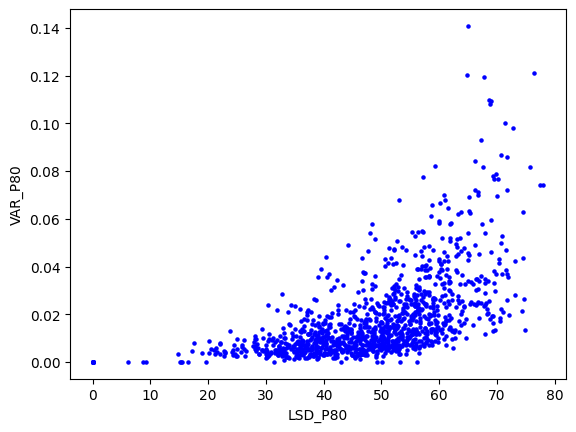

In [ ]:
plt.scatter(LSD_P80, VAR_P80, s = 5, c = 'b')
plt.xlabel('LSD_P80', fontsize = 10)
plt.ylabel('VAR_P80', fontsize = 10)

Text(0, 0.5, 'VAR_Mean')

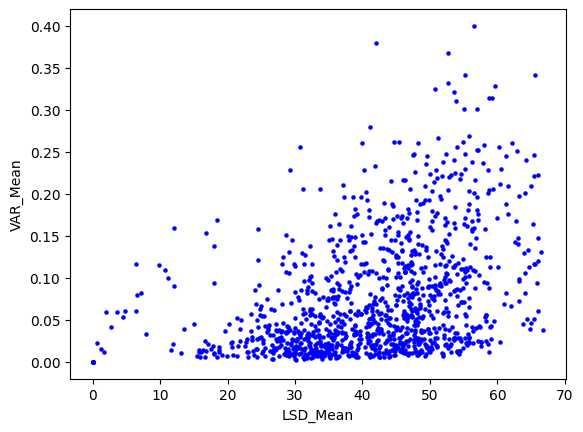

In [ ]:
plt.scatter(LSD_Mean, VAR_Mean, s = 5, c = 'b')
plt.xlabel('LSD_Mean', fontsize = 10)
plt.ylabel('VAR_Mean', fontsize = 10)

Text(0, 0.5, 'VAR_P80')

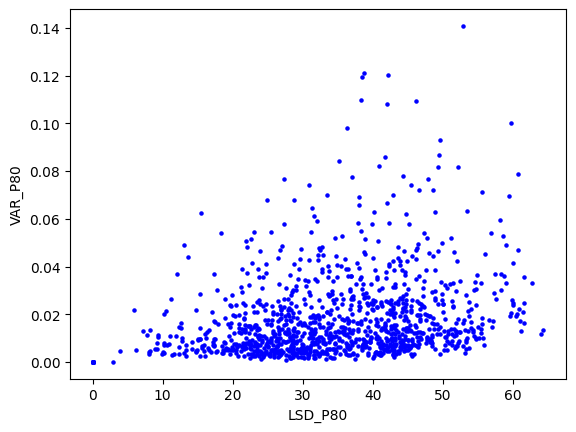

In [ ]:
plt.scatter(LSD_P20, VAR_P20, s = 5, c = 'b')
plt.xlabel('LSD_P80', fontsize = 10)
plt.ylabel('VAR_P80', fontsize = 10)

In [ ]:
#plt.scatter(lsd,var, s = 5, c = 'b')

# DataFrame

In [ ]:
LSD_P20.shape
array=np.zeros((50*24,12))
array[:,0]=LSD_P20.flatten()
array[:,1]=LSD_Mean.flatten()
array[:,2]=LSD_P80.flatten()
array[:,3]=LSD_DE.flatten()
array[:,4]=VAR_P20.flatten()
array[:,5]=VAR_Mean.flatten()
array[:,6]=VAR_P80.flatten()
array[:,7]=VAR_DE.flatten()
array[:,8]=AMP_P20.flatten()
array[:,9]=AMP_Mean.flatten()
array[:,10]=AMP_P80.flatten()
array[:,11]=AMP_DE.flatten()
array

array([[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       ...,
       [ 4.88155746e+01,  5.40799446e+01,  5.75663948e+01, ...,
        -5.77418633e+04,  9.86339531e+04,  6.00637627e+00],
       [ 6.07230301e+01,  6.54316025e+01,  6.97441788e+01, ...,
         2.22610864e+03,  1.36991375e+05,  6.39804888e+00],
       [ 5.45836067e+01,  6.04426994e+01,  6.54336395e+01, ...,
        -6.02762207e+03,  1.09593102e+05,  8.76172352e+00]])

In [ ]:
EST=pd.DataFrame(array, columns = ['LSD - Percentil 20','LSD - Media', 'LSD - Percentil 80','LSD - Desviación Estándar','Variance - Percentil 20','Variance - Media', 'Variance - Percentil 80','Variance - Desviación Estándar', 'Amplitud - Percentil 20','Amplitud - Media', 'Amplitud - Percentil 80','Amplitud - Desviación Estándar'])

In [ ]:
EST.describe()

,LSD - Percentil 20,LSD - Media,LSD - Percentil 80,LSD - Desviación Estándar,Variance - Percentil 20,Variance - Media,Variance - Percentil 80,Variance - Desviación Estándar,Amplitud - Percentil 20,Amplitud - Media,Amplitud - Percentil 80,Amplitud - Desviación Estándar
count,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000
mean,33.597437,40.757114,47.336368,9.087846,0.017697,0.073355,0.017697,9.087846,-134046.058699,23.716620,132772.057186,9.011773
std,13.385642,13.044619,14.283894,5.057637,0.017698,0.068879,0.017698,5.057637,86067.952632,33919.432559,84782.051788,4.969832
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-575363.812500,-130039.062500,-54796.550781,0.000000
25%,25.371498,33.162512,39.115389,5.222135,0.006258,0.021314,0.006258,5.222135,-178088.796875,-17466.400391,68495.687500,5.173719
50%,33.906237,42.358112,49.210201,8.042428,0.012290,0.050298,0.012290,8.042428,-109593.101562,0.000000,109593.101562,7.975668
75%,43.259030,49.786958,56.769964,12.313567,0.023582,0.107360,0.023582,12.313567,-71235.476562,15317.348877,178088.796875,12.075374
max,64.307922,66.822884,78.044914,29.436281,0.140854,0.400143,0.140854,29.436281,27398.275391,126032.062500,547965.500000,28.807884


In [ ]:
print(EST)

      LSD - Percentil 20  LSD - Media  LSD - Percentil 80  \
0               0.000000     0.000000            0.000000   
1               0.000000     0.000000            0.000000   
2               0.000000     0.000000            0.000000   
3               0.000000     0.000000            0.000000   
4               0.000000     0.000000            0.000000   
...                  ...          ...                 ...   
1195           61.464684    64.373253           66.644562   
1196           59.566196    63.795223           69.128464   
1197           48.815575    54.079945           57.566395   
1198           60.723030    65.431602           69.744179   
1199           54.583607    60.442699           65.433640   

      LSD - Desviación Estándar  Variance - Percentil 20  Variance - Media  \
0                      0.000000                 0.000000          0.000000   
1                      0.000000                 0.000000          0.000000   
2                      0.000000  

In [ ]:
EST.to_excel (r'DATOS XLINE 1100.xlsx', index = False, header=True)

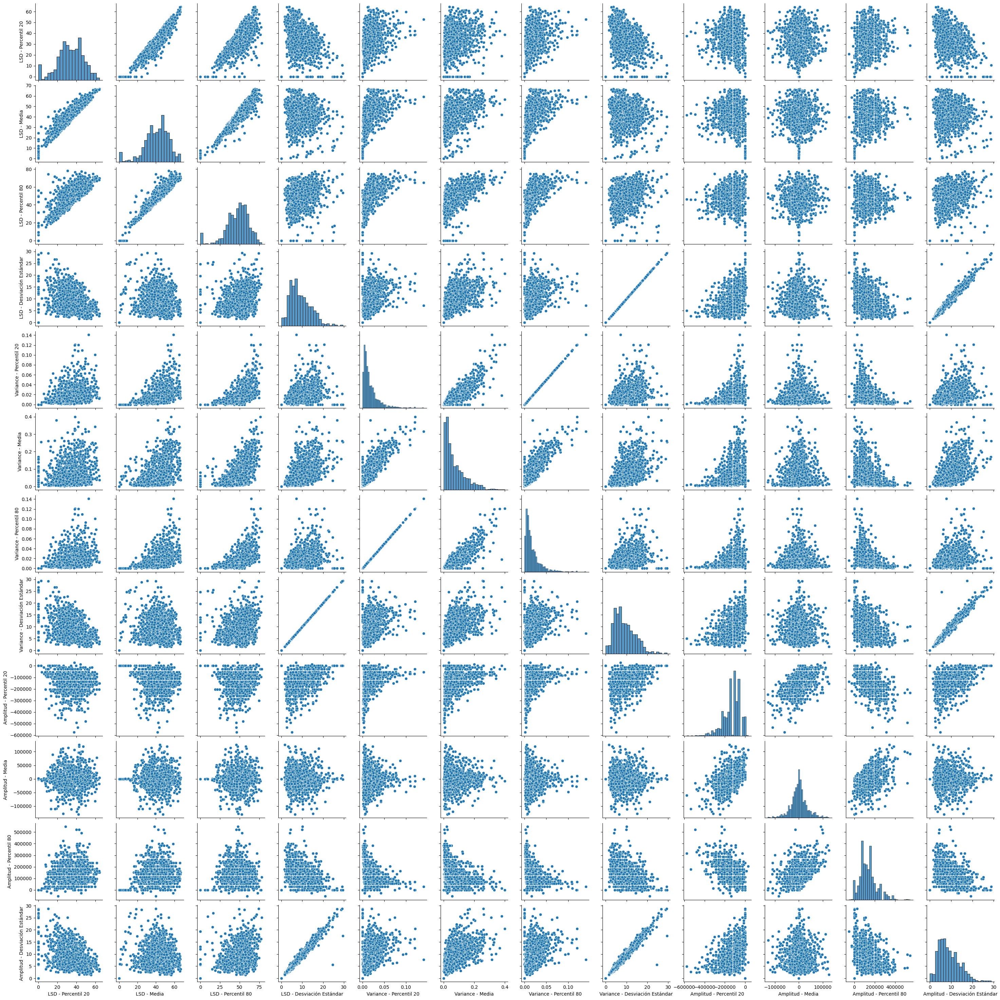

In [ ]:
sns.pairplot(EST)

(array([ 36.,   6.,  19.,  55., 180., 214., 304., 252., 103.,  31.]),
 array([ 0.        ,  7.80449142, 15.60898285, 23.41347427, 31.2179657 ,
        39.02245712, 46.82694855, 54.63143997, 62.4359314 , 70.24042282,
        78.04491425]),
 <BarContainer object of 10 artists>)

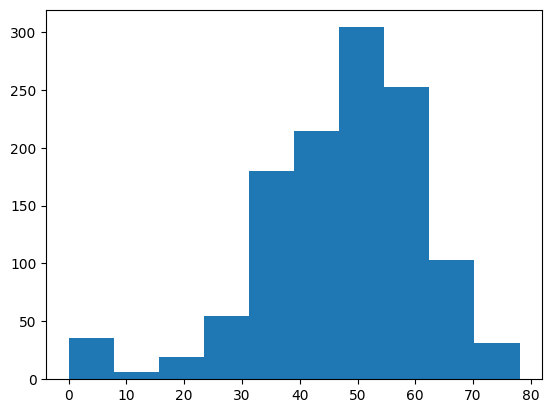

In [ ]:
plt.hist(EST['LSD - Percentil 80'])

/tmp/ipython-input-3190653568.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(EST['LSD - Percentil 80'],bins=100,kde = True,hist=False)
/tmp/ipython-input-3190653568.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(EST['LSD - Percentil 80'],bins=100)


<Axes: xlabel='LSD - Percentil 80', ylabel='Density'>

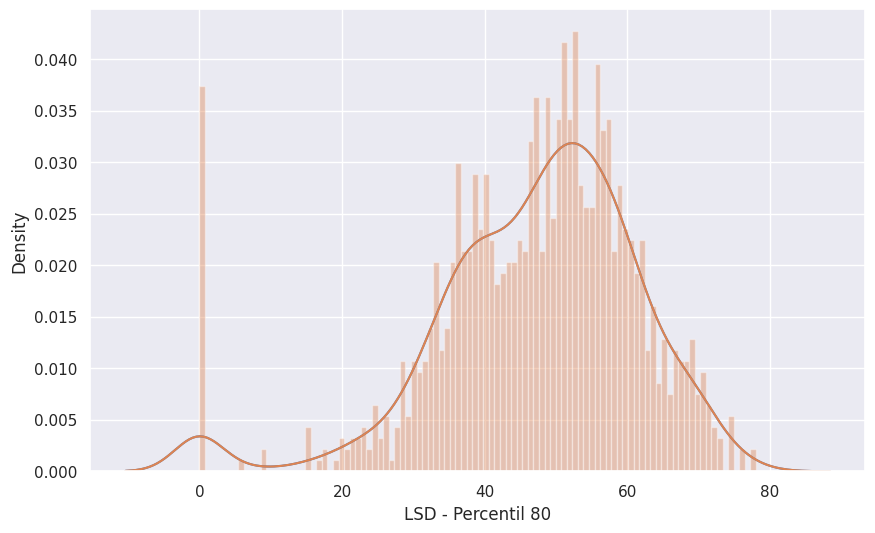

In [ ]:
sns.set(color_codes=True)
plt.figure(figsize=(10,6))
sns.distplot(EST['LSD - Percentil 80'],bins=100,kde = True,hist=False)
sns.distplot(EST['LSD - Percentil 80'],bins=100)


<Figure size 1000x600 with 0 Axes>

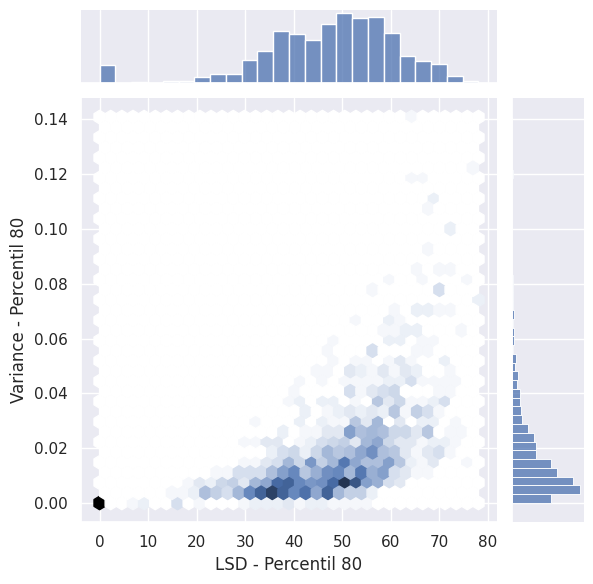

In [ ]:
plt.figure(figsize=(10,6))
sns.jointplot(x = EST['LSD - Percentil 80'], y = EST['Variance - Percentil 80'],kind="hex", color="b")

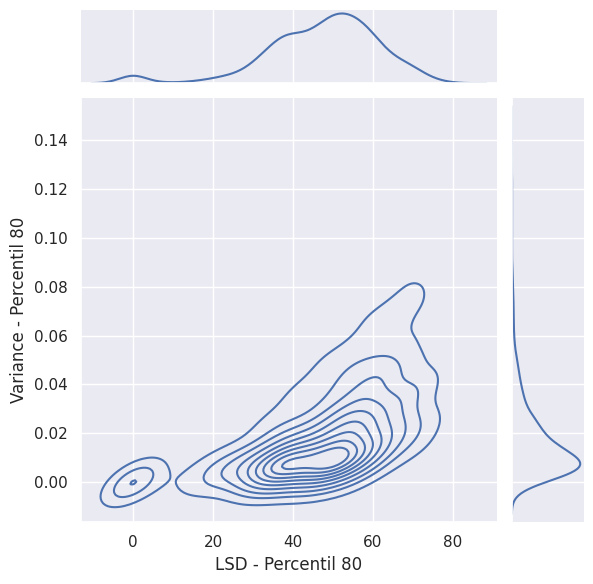

In [ ]:
###Con kernel density estimation(KDE)
sns.jointplot(x = EST['LSD - Percentil 80'], y = EST['Variance - Percentil 80'],kind="kde", color="b")

###**Mapas de Calor**

In [ ]:
correlation_matrix = EST.corr()
correlation_matrix

,LSD - Percentil 20,LSD - Media,LSD - Percentil 80,LSD - Desviación Estándar,Variance - Percentil 20,Variance - Media,Variance - Percentil 80,Variance - Desviación Estándar,Amplitud - Percentil 20,Amplitud - Media,Amplitud - Percentil 80,Amplitud - Desviación Estándar
LSD - Percentil 20,1.000000,0.945983,0.807267,-0.271442,0.310927,0.204851,0.310927,-0.271442,-0.251768,0.003649,0.243182,-0.257428
LSD - Media,0.945983,1.000000,0.950241,0.034490,0.470367,0.414345,0.470367,0.034490,-0.171184,0.007236,0.163243,0.044350
LSD - Percentil 80,0.807267,0.950241,1.000000,0.294201,0.572926,0.566526,0.572926,0.294201,-0.084130,0.010995,0.078699,0.304066
LSD - Desviación Estándar,-0.271442,0.034490,0.294201,1.000000,0.424580,0.622594,0.424580,1.000000,0.298908,0.009096,-0.297932,0.980505
Variance - Percentil 20,0.310927,0.470367,0.572926,0.424580,1.000000,0.843782,1.000000,0.424580,0.286850,-0.002428,-0.297762,0.428819
Variance - Media,0.204851,0.414345,0.566526,0.622594,0.843782,1.000000,0.843782,0.622594,0.345527,0.021137,-0.332804,0.620547
Variance - Percentil 80,0.310927,0.470367,0.572926,0.424580,1.000000,0.843782,1.000000,0.424580,0.286850,-0.002428,-0.297762,0.428819
Variance - Desviación Estándar,-0.271442,0.034490,0.294201,1.000000,0.424580,0.622594,0.424580,1.000000,0.298908,0.009096,-0.297932,0.980505
Amplitud - Percentil 20,-0.251768,-0.171184,-0.084130,0.298908,0.286850,0.345527,0.286850,0.298908,1.000000,0.428978,-0.591554,0.291172
Amplitud - Media,0.003649,0.007236,0.010995,0.009096,-0.002428,0.021137,-0.002428,0.009096,0.428978,1.000000,0.418839,0.006355


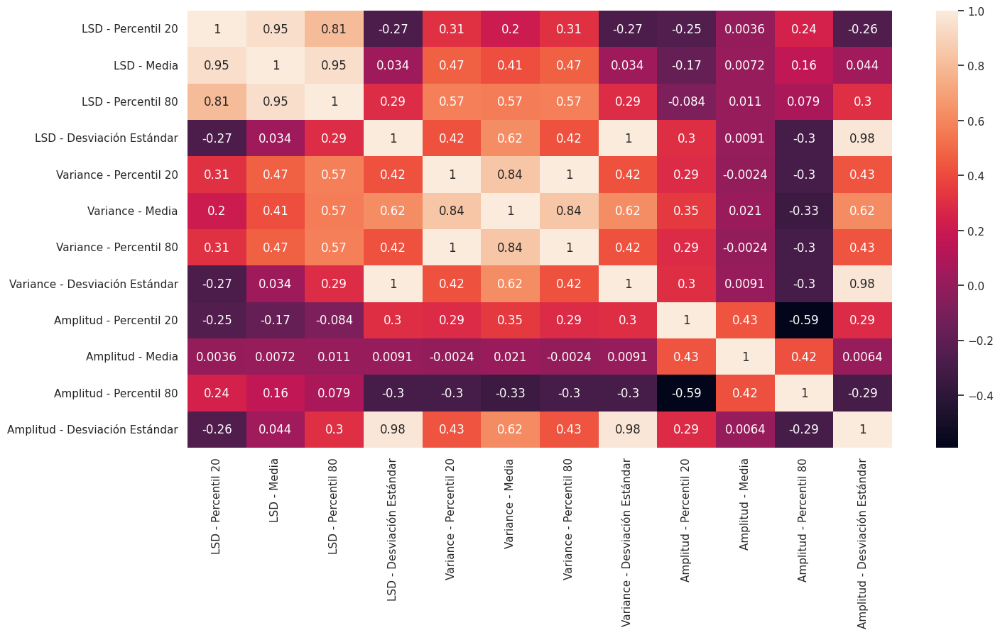

In [ ]:
plt.figure(figsize = (16,8))
sns.heatmap(correlation_matrix,annot=True)
plt.savefig('mapa de calor')

Text(0, 0.5, 'Variance')

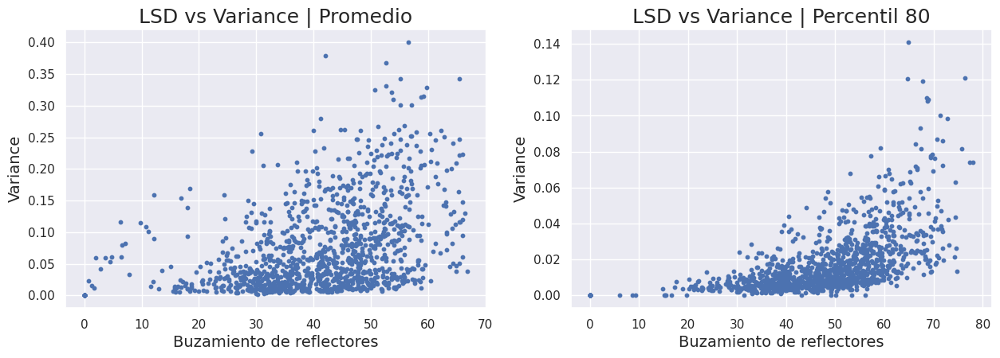

In [ ]:
plt.figure(figsize = (15, 10))

###Crossplot

# Plot 1
plt.subplot(2, 2, 1) # 2 filas, 2 columnas, posicion 1
plt.title('LSD vs Variance | Promedio', fontsize = 18)
plt.scatter(EST['LSD - Media'], EST['Variance - Media'],s=10)
plt.xlabel('Buzamiento de reflectores', fontsize = 14)
plt.ylabel('Variance', fontsize = 14)

plt.subplot(2, 2, 2) # 2 filas, 2 columnas, posicion 1
plt.title('LSD vs Variance | Percentil 80', fontsize = 18)
plt.scatter(EST['LSD - Percentil 80'], EST['Variance - Percentil 80'],s=10)
plt.xlabel('Buzamiento de reflectores', fontsize = 14)
plt.ylabel('Variance', fontsize = 14)




# K Means

In [ ]:
EST

,LSD - Percentil 20,LSD - Media,LSD - Percentil 80,LSD - Desviación Estándar,Variance - Percentil 20,Variance - Media,Variance - Percentil 80,Variance - Desviación Estándar,Amplitud - Percentil 20,Amplitud - Media,Amplitud - Percentil 80,Amplitud - Desviación Estándar
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
1195,61.464684,64.373253,66.644562,3.361903,0.024781,0.051207,0.024781,3.361903,-136991.375000,22124.105469,164389.656250,3.572888
1196,59.566196,63.795223,69.128464,7.513187,0.019051,0.045604,0.019051,7.513187,-150690.515625,-7568.774902,150690.515625,8.058413
1197,48.815575,54.079945,57.566395,5.928448,0.038560,0.105097,0.038560,5.928448,-208226.843750,-57741.863281,98633.953125,6.006376
1198,60.723030,65.431602,69.744179,6.633680,0.078681,0.221563,0.078681,6.633680,-136991.375000,2226.108643,136991.375000,6.398049


In [ ]:
EST.describe()

,LSD - Percentil 20,LSD - Media,LSD - Percentil 80,LSD - Desviación Estándar,Variance - Percentil 20,Variance - Media,Variance - Percentil 80,Variance - Desviación Estándar,Amplitud - Percentil 20,Amplitud - Media,Amplitud - Percentil 80,Amplitud - Desviación Estándar
count,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000
mean,33.597437,40.757114,47.336368,9.087846,0.017697,0.073355,0.017697,9.087846,-134046.058699,23.716620,132772.057186,9.011773
std,13.385642,13.044619,14.283894,5.057637,0.017698,0.068879,0.017698,5.057637,86067.952632,33919.432559,84782.051788,4.969832
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-575363.812500,-130039.062500,-54796.550781,0.000000
25%,25.371498,33.162512,39.115389,5.222135,0.006258,0.021314,0.006258,5.222135,-178088.796875,-17466.400391,68495.687500,5.173719
50%,33.906237,42.358112,49.210201,8.042428,0.012290,0.050298,0.012290,8.042428,-109593.101562,0.000000,109593.101562,7.975668
75%,43.259030,49.786958,56.769964,12.313567,0.023582,0.107360,0.023582,12.313567,-71235.476562,15317.348877,178088.796875,12.075374
max,64.307922,66.822884,78.044914,29.436281,0.140854,0.400143,0.140854,29.436281,27398.275391,126032.062500,547965.500000,28.807884


In [ ]:
#x=EST['LSD - Percentil 80'].values
#y=EST['Variance - Percentil 80'].values
#Kmean = KMeans(n_clusters=8)
#Kmean.fit(X)
#KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300, n_clusters=5, n_init=10, n_jobs=1, precompute_distances='auto',random_state=None, tol=0.0001, verbose=0)
#Kmean.cluster_centers_
#labels=Kmean.predict(X)
#centroids=Kmean.cluster_centers_

In [ ]:
x=EST['LSD - Percentil 80'].values
y=EST['Variance - Percentil 80'].values

In [ ]:
X=np.array(list(zip(x,y)))
print(X)

[[0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00]
 ...
 [5.75663948e+01 3.85604277e-02]
 [6.97441788e+01 7.86808804e-02]
 [6.54336395e+01 3.33687961e-02]]


In [ ]:
Kmean = KMeans(n_clusters=8)

In [ ]:
Kmean.fit(X)

KMeans()

In [ ]:
KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300, n_clusters=5, n_init=10,random_state=None, tol=0.0001, verbose=0)

KMeans(algorithm='auto', n_clusters=5, n_init=10)

In [ ]:
Kmean.cluster_centers_

array([[ 2.20614980e+01,  4.63221186e-03],
       [ 5.33422690e+01,  1.79353182e-02],
       [ 3.92498712e+01,  9.94622979e-03],
       [ 6.89314224e+01,  4.72404688e-02],
       [ 6.32240622e-01, -3.46944695e-18],
       [ 4.68538025e+01,  1.27413948e-02],
       [ 6.00251909e+01,  2.82096525e-02],
       [ 3.23127920e+01,  6.95038634e-03]])

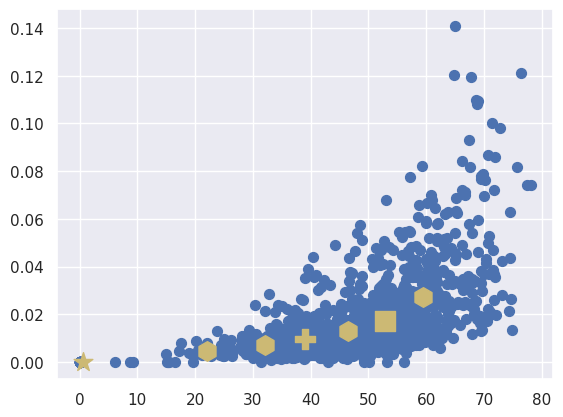

<Figure size 1500x1000 with 0 Axes>

In [ ]:
plt.scatter(X[ : , 0], X[ : , 1], s =50, c='b')
plt.scatter(5.27905130e+01, 1.70865501e-02, s=200, c='y', marker='s')
plt.scatter(3.90055438e+01, 9.82621958e-03, s=200, c='y', marker='P')
plt.scatter(6.32240187e-01, 0.00000000e+00, s=200, c='y', marker='*')
plt.scatter(3.21056142e+01, 7.08932981e-03, s=200, c='y', marker='h')
plt.scatter(4.64451927e+01, 1.28317014e-02, s=200, c='y', marker='h')
plt.scatter(5.95024944e+01, 2.73289856e-02, s=200, c='y', marker='h')
plt.scatter(2.20614968e+01, 4.63221178e-03, s=200, c='y', marker='h')
plt.figure(figsize = (15, 10))
plt.show()

In [ ]:
labels=Kmean.predict(X)
centroids=Kmean.cluster_centers_

In [ ]:
labels
labels.shape

(1200,)

In [ ]:
labels

array([4, 4, 4, ..., 6, 3, 3], dtype=int32)

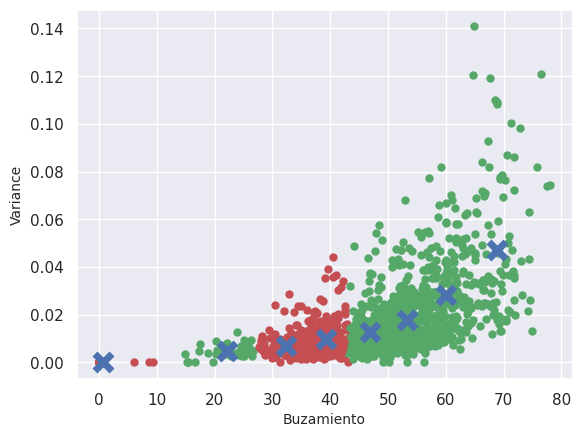

<Figure size 2500x2500 with 0 Axes>

In [ ]:
colors=['g.','g.','r.','g.','r.','g.','g.','r.']
for i in range(len(X)):
    #print('Ventana',i,":",X[i],' Label: ',labels[i])
    plt.plot(X[i,0],X[i,1],colors[labels[i]],markersize=10)
plt.scatter(centroids[:,0],centroids[:,1],marker='x',s=150,linewidth=5,zorder=10)
plt.xlabel('Buzamiento', fontsize = 10)
plt.ylabel('Variance', fontsize = 10)
plt.figure(figsize = (25, 25))
plt.show()

In [ ]:
facies=labels
facies.shape=(50,24)
map = facies
def get_color_coded_str(i):
   return "\033[3{}m{}\033[0m".format(i+1, i)
map_modified = np.vectorize(get_color_coded_str)(map)
print("\n".join([" ".join(["{}"]*10)]*10).format(*[x for y in map_modified.tolist() for x in y]))

4 4 4 4 4 4 4 4 4 4
4 4 4 4 4 4 4 4 4 4
4 4 4 4 4 4 4 4 0 4
4 4 4 4 4 0 4 4 4 4
0 5 2 0 7 5 0 1 7 1
3 3 2 0 2 6 7 2 7 1
2 3 1 7 5 3 5 6 5 2
6 3 0 7 6 2 7 0 0 0
7 7 0 0 0 0 2 7 2 2
2 5 1 1 6 6 0 6 1 2


In [ ]:
def get_color_coded_str(i):
    return "\033[4{}m{}\033[0m".format(i+1, i)
map_modified = np.vectorize(get_color_coded_str)(map)
print("\n".join([" ".join(["{}"]*10)]*10).format(*[x for y in map_modified.tolist() for x in y]))

4 4 4 4 4 4 4 4 4 4
4 4 4 4 4 4 4 4 4 4
4 4 4 4 4 4 4 4 0 4
4 4 4 4 4 0 4 4 4 4
0 5 2 0 7 5 0 1 7 1
3 3 2 0 2 6 7 2 7 1
2 3 1 7 5 3 5 6 5 2
6 3 0 7 6 2 7 0 0 0
7 7 0 0 0 0 2 7 2 2
2 5 1 1 6 6 0 6 1 2


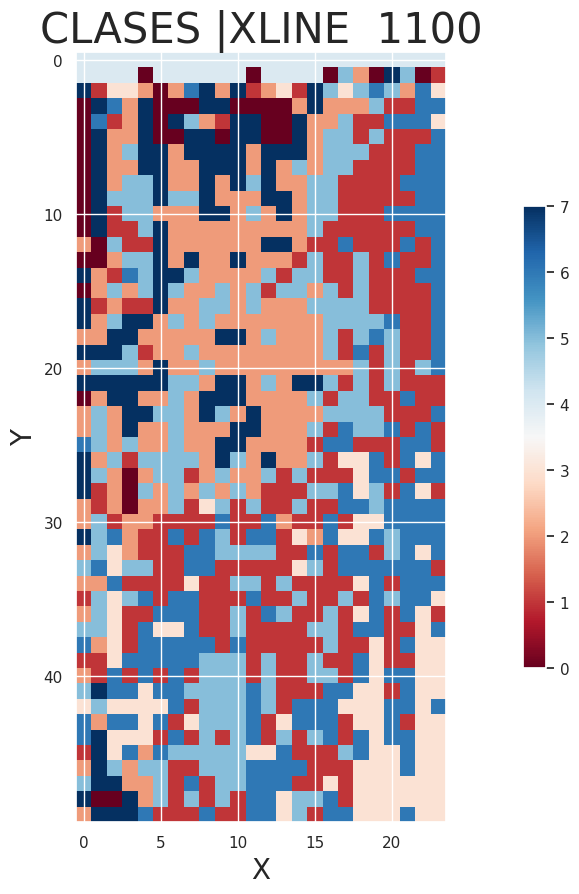

In [ ]:
plt.figure(figsize = (20, 10))
plt.imshow(facies[:,:], cmap = 'RdBu')
plt.xlabel('X', fontsize = 20)
plt.ylabel('Y', fontsize = 20)
plt.title('CLASES |XLINE  1100', fontsize = 30)
plt.colorbar(shrink=0.6)

In [ ]:
lista=np.array([0,1,2,3,4,2,1,4,1,4,2,1,2,0,1])

In [ ]:
len(lista)

15

In [ ]:
lista=facies.flatten()
for i in np.arange(0,1200,1):
    if lista[i]==2:
        lista[i]=0
    if lista[i]==7:
        lista[i]=0
    if lista[i]==1:
        lista[i]=1
    if lista[i]==3:
        lista[i]=1
    if lista[i]==4:
        lista[i]=0
    if lista[i]==5:
        lista[i]=1
    if lista[i]==6:
        lista[i]=1
print(lista)


[0 0 0 ... 1 1 1]


In [ ]:
len(lista)

1200

In [ ]:
facies_new=lista
facies_new.shape=(50,24)
facies_new

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 1, 0, 1],
       [0, 1, 1, ..., 0, 1, 1],
       ...,
       [1, 0, 0, ..., 1, 1, 1],
       [0, 0, 0, ..., 1, 1, 1],
       [0, 0, 0, ..., 1, 1, 1]], dtype=int32)

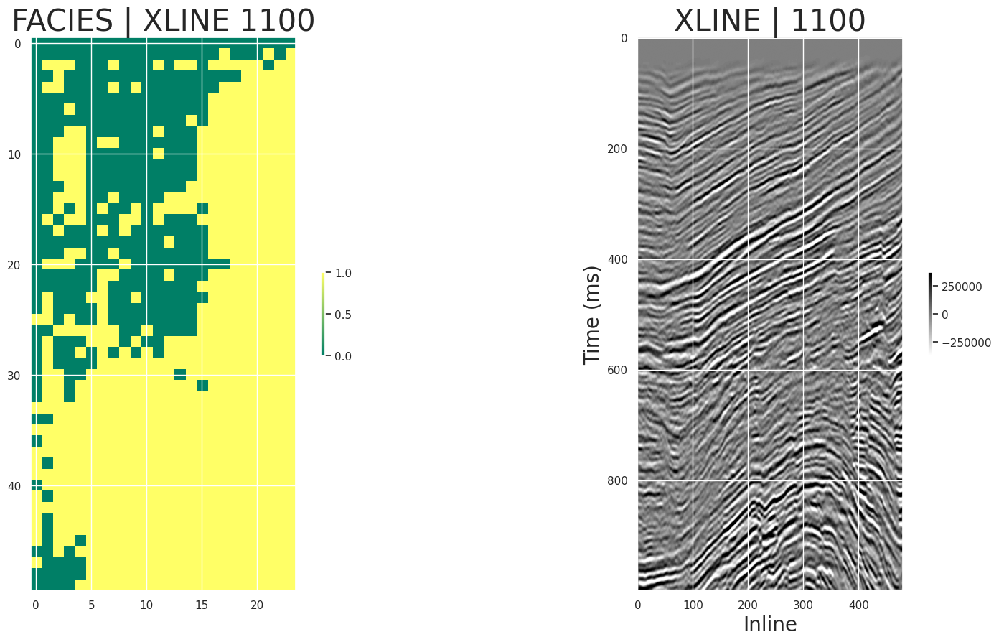

In [ ]:
plt.figure(figsize = (20, 10))

# Construir subplots de forma independiente

# Plot 1
plt.subplot(1, 2, 1) # 2 filas, 2 columnas, posicion 1
#plt.figure(figsize = (20, 10))
plt.imshow(facies_new[:,:], cmap = 'summer')
plt.title('FACIES | XLINE 1100', fontsize = 30)
plt.colorbar(shrink=0.15)

# Plot 2
plt.subplot(1, 2, 2) # 2 filas, 2 columnas, posicion 2
#plt.figure(figsize = (20, 10))
plt.imshow(cubo3d[:480, 1, :1000].T, cmap = 'gray_r', vmax = amplitude_max, vmin = -amplitude_max)
plt.xlabel('Inline', fontsize = 20)
plt.ylabel('Time (ms)', fontsize = 20)
plt.title('XLINE | 1100', fontsize = 30)
plt.colorbar(shrink=0.15)
#plt.savefig('sismica.png')

#**ML Supervised learning **

In [ ]:
x=EST['LSD - Percentil 80']
y=EST['Variance - Percentil 80']

In [ ]:
X_train,X_test,y_train,y_test=train_test_split(x,y,test_size=0.5,random_state=42)

In [ ]:
print('X train')
print(X_train)
print()
print('y train')
print(y_train)

X train
999     50.608459
251     47.819885
69      41.692482
131     32.942112
300     35.129951
          ...    
1044    50.291771
1095    56.605675
1130    31.499653
860     48.923763
1126    69.490303
Name: LSD - Percentil 80, Length: 600, dtype: float64

y train
999     0.003888
251     0.014796
69      0.008603
131     0.005668
300     0.004002
          ...   
1044    0.023147
1095    0.006673
1130    0.004987
860     0.007036
1126    0.032973
Name: Variance - Percentil 80, Length: 600, dtype: float64


In [ ]:
X_train.shape

(600,)

In [ ]:
from sklearn import linear_model
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [ ]:
X_train=X_train.values.reshape([X_train.values.shape[0],1])
X_test=X_test.values.reshape([X_test.values.shape[0],1])

In [ ]:
regr=linear_model.LinearRegression()
regr.fit(X_train,y_train)

LinearRegression()

In [ ]:
y_pred=regr.predict(X_test)

Error:  0.00020863532949006808
El valor de r^2 0.3207124637018116


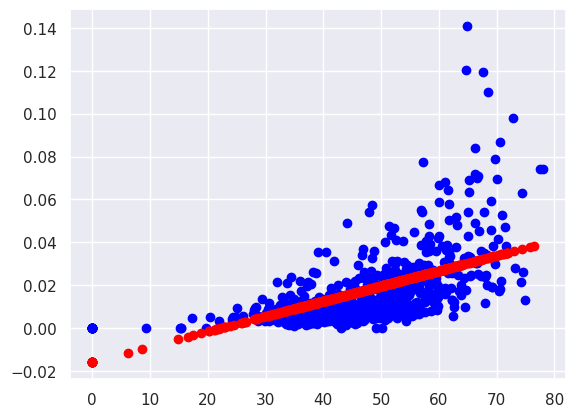

In [ ]:
plt.scatter(X_train,y_train,color='blue')
plt.scatter(X_test,y_pred,color='red')
print('Error: ',mean_squared_error(y_test,y_pred))
print('El valor de r^2',r2_score(y_test,y_pred))

Polinomial Multivariable

In [ ]:
data_labels=pd.read_csv('/content/drive/MyDrive/Datos/DATOS XLINE 1100 2.csv')

In [ ]:
data_labels.describe()

,LSD - Percentil 20,LSD - Media,LSD - Percentil 80,LSD - Desviación Estándar,Variance - Percentil 20,Variance - Media,Variance - Percentil 80,Variance - Desviación Estándar,Amplitud - Percentil 20,Amplitud - Media,Amplitud - Percentil 80,Amplitud - Desviación Estándar,FACIE
count,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000
mean,33.779961,40.856809,47.439015,9.011773,0.017749,0.073415,0.017749,9.011773,-134046.062730,23.716620,132772.042894,9.011773,2.112500
std,13.372184,13.090477,14.328758,4.969832,0.017848,0.068609,0.017848,4.969832,86067.954139,33919.432560,84782.045146,4.969832,0.544755
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-575363.812500,-130039.062500,-54796.550780,0.000000,1.000000
25%,25.335139,33.294909,39.144023,5.173719,0.006187,0.021655,0.006187,5.173719,-178088.796900,-17466.400388,68495.687500,5.173719,2.000000
50%,34.103734,42.503393,49.432486,7.975668,0.012101,0.049458,0.012101,7.975668,-109593.101600,0.000000,109593.101600,7.975668,2.000000
75%,43.563381,50.028002,56.892697,12.075374,0.023361,0.110330,0.023361,12.075374,-71235.515620,15317.348878,178088.796900,12.075374,2.000000
max,64.080202,66.709122,79.230775,28.807884,0.146032,0.403677,0.146032,28.807884,27398.275390,126032.062500,547965.500000,28.807884,3.000000


In [ ]:
nuevo=data_labels[['LSD - Percentil 80','Variance - Percentil 80','Amplitud - Percentil 80','FACIE']]

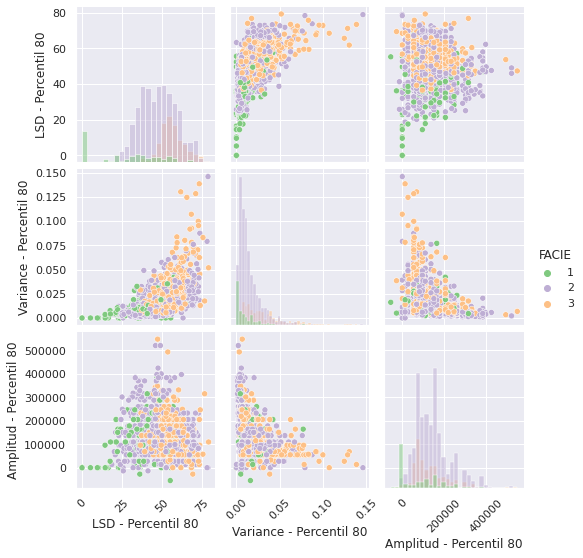

In [ ]:
g=sns.pairplot(nuevo,hue='FACIE',diag_kind='hist',palette='Accent')
for ax in g.axes.flat:
    plt.setp(ax.get_xticklabels(),rotation=45)

In [ ]:
matrix=np.zeros((50*24,12))
matrix[:,0]=LSD_Mean.flatten()
matrix[:,1]=LSD_P80.flatten()
matrix[:,2]=VAR_Mean.flatten()
matrix[:,3]=VAR_P80.flatten()
matrix[:,4]=AMP_Mean.flatten()
matrix[:,5]=AMP_P80.flatten()
matrix[:,6]=RI_Mean.flatten()
matrix[:,7]=RI_P80.flatten()
matrix[:,8]=envelope_Mean.flatten()
matrix[:,9]=envelope_P80.flatten()
matrix[:,10]=glcm_Mean.flatten()
matrix[:,11]=glcm_P80.flatten()
matrix

array([[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 1.00000000e+00, 1.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 1.00000000e+00, 1.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 1.00000000e+00, 1.00000000e+00],
       ...,
       [5.40799446e+01, 5.75663948e+01, 1.05096795e-01, ...,
        3.45306094e+05, 7.52562463e-01, 9.14979696e-01],
       [6.54316025e+01, 6.97441788e+01, 2.21563384e-01, ...,
        3.02492594e+05, 6.96835876e-01, 7.91520417e-01],
       [6.04426994e+01, 6.54336395e+01, 2.11461052e-01, ...,
        2.40833172e+05, 6.45843506e-01, 7.36295640e-01]])

In [ ]:
df=pd.DataFrame(matrix, columns = ['LSD - Media','LSD - Percentil 80','Variance - Media', 'Variance - Percentil 80','Amplitud - Media', 'Amplitud - Percentil 80','Reflection Intensity - Media', 'Reflection Intensity - Percentil 80','Envelope - Media', 'Envelope - Percentil 80','GLCM - Media','GLCM - Percentil 80'])

In [ ]:
df.describe()

,LSD - Media,LSD - Percentil 80,Variance - Media,Variance - Percentil 80,Amplitud - Media,Amplitud - Percentil 80,Reflection Intensity - Media,Reflection Intensity - Percentil 80,Envelope - Media,Envelope - Percentil 80,GLCM - Media,GLCM - Percentil 80
count,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1.200000e+03,1200.000000,1200.000000
mean,40.757114,47.336368,0.073355,0.017697,23.716620,132772.057186,218.258663,299.624783,192982.920211,2.687322e+05,0.727157,0.852194
std,13.044619,14.283894,0.068879,0.017698,33919.432559,84782.051788,115.123724,158.568704,102124.718012,1.434824e+05,0.083191,0.102388
min,0.000000,0.000000,0.000000,0.000000,-130039.062500,-54796.550781,0.000000,0.000000,0.000000,0.000000e+00,0.537510,0.563841
25%,33.162512,39.115389,0.021314,0.006258,-17466.400391,68495.687500,140.116501,193.614517,123735.193359,1.721417e+05,0.673162,0.774430
50%,42.358112,49.210201,0.050298,0.012290,0.000000,109593.101562,205.751549,277.027008,180284.796875,2.496345e+05,0.711667,0.855064
75%,49.786958,56.769964,0.107360,0.023582,15317.348877,178088.796875,284.240959,390.273277,250812.558594,3.449562e+05,0.763895,0.940322
max,66.822884,78.044914,0.400143,0.140854,126032.062500,547965.500000,780.299133,1060.617798,687598.312500,1.021202e+06,1.000000,1.000000


In [ ]:
#sns.pairplot(df)

In [ ]:
df.to_excel (r'Atributos XLINE 1100.xlsx', index = False, header=True)

In [ ]:
datos_labels=pd.read_csv('/content/drive/MyDrive/Datos/Atributos XLINE 1100.csv')

In [ ]:
datos_labels.describe()

,LSD - Media,LSD - Percentil 80,Variance - Media,Variance - Percentil 80,Amplitud - Media,Amplitud - Percentil 80,Reflection Intensity - Media,Reflection Intensity - Percentil 80,Envelope - Media,Envelope - Percentil 80,GLCM - Media,GLCM - Percentil 80,FACIE
count,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1.200000e+03,1200.000000,1200.000000,1200.000000
mean,40.757114,47.336367,0.073355,0.017749,23.716620,132772.042894,218.258663,299.624771,192982.920223,2.687321e+05,0.727157,0.852194,2.112500
std,13.044619,14.283893,0.068879,0.017848,33919.432560,84782.045146,115.123724,158.568698,102124.718019,1.434824e+05,0.083191,0.102388,0.544755
min,0.000000,0.000000,0.000000,0.000000,-130039.062500,-54796.550780,0.000000,0.000000,0.000000,0.000000e+00,0.537510,0.563841,1.000000
25%,33.162512,39.115389,0.021314,0.006187,-17466.400388,68495.687500,140.116501,193.614496,123735.193350,1.721417e+05,0.673162,0.774430,2.000000
50%,42.358112,49.210200,0.050298,0.012101,0.000000,109593.101600,205.751549,277.027011,180284.796900,2.496345e+05,0.711667,0.855064,2.000000
75%,49.786958,56.769961,0.107360,0.023361,15317.348878,178088.796900,284.240959,390.273259,250812.558625,3.449562e+05,0.763895,0.940322,2.000000
max,66.822884,78.044913,0.400143,0.146032,126032.062500,547965.500000,780.299133,1060.617725,687598.312500,1.021202e+06,1.000000,1.000000,3.000000


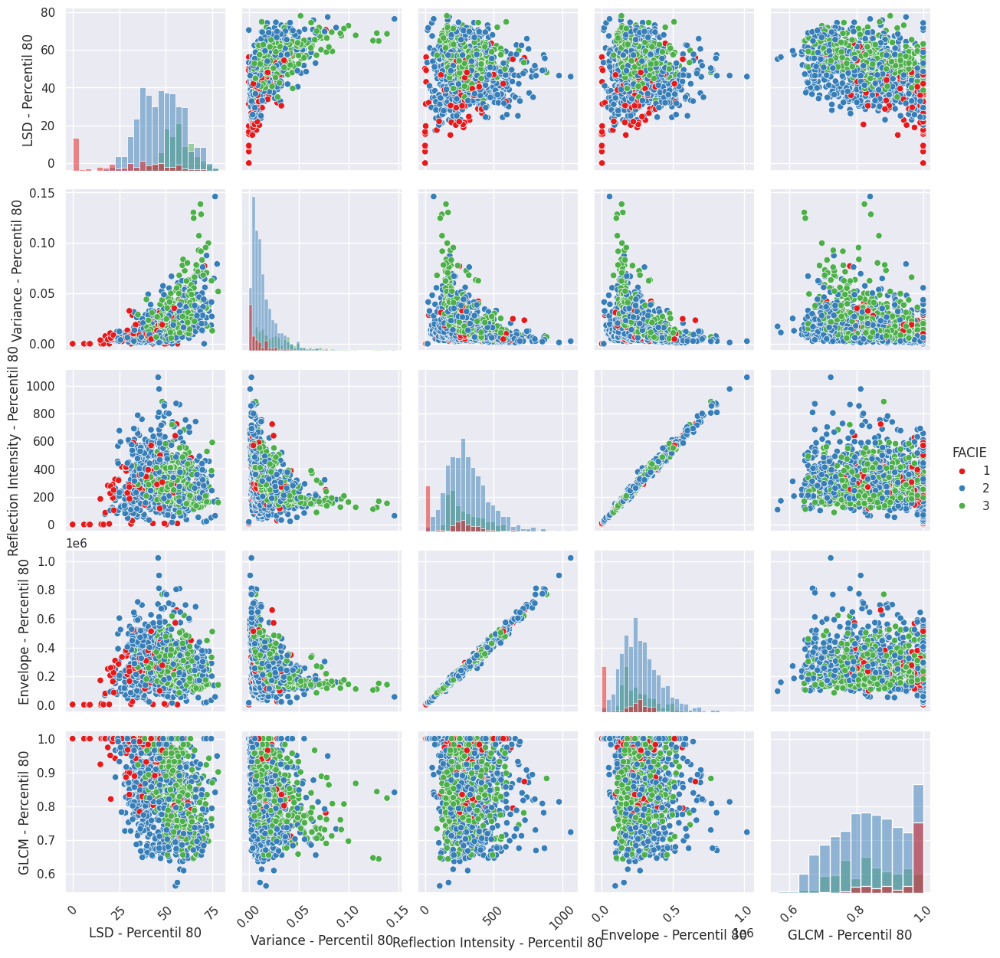

In [ ]:
new=datos_labels[['LSD - Percentil 80','Variance - Percentil 80','Reflection Intensity - Percentil 80','Envelope - Percentil 80','GLCM - Percentil 80','FACIE']]
g=sns.pairplot(new,hue='FACIE',diag_kind='hist',palette='Set1')
for ax in g.axes.flat:
    plt.setp(ax.get_xticklabels(),rotation=45)

Regresion Lineal Multiple

In [ ]:
datos=new

In [ ]:
lsd=datos['LSD - Percentil 80'].values
variance=datos['Variance - Percentil 80'].values
ri=datos['Reflection Intensity - Percentil 80'].values
envelope=datos['Envelope - Percentil 80'].values
glcm=datos['GLCM - Percentil 80'].values
facies_=datos['FACIE'].values

In [ ]:
X=np.array([lsd,glcm,variance]).T
Y=np.array(facies_)
print(X)
print(Y)

[[0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 1.00000000e+00 0.00000000e+00]
 ...
 [5.75663956e+01 9.14979672e-01 3.86195610e-02]
 [6.97441788e+01 7.91520429e-01 7.60348010e-02]
 [6.54336380e+01 7.36295652e-01 3.79423440e-02]]
[1 1 1 ... 2 2 2]


In [ ]:
##Modelo
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

reg=LinearRegression()
reg=reg.fit(X,Y)
Y_pred=reg.predict(X)
error=np.sqrt(mean_squared_error(Y,Y_pred)) ###Error entre valor original y el del modelo
r2=reg.score(X,Y) ###r2 mas cercano a , la correlaci[on es mejor]
print('El valor de r^2 es: ', r2)
print('los coeficientes son: ',reg.coef_)
lsd=50
glcm=1
variance=0.015
print('FACIE :', int(reg.predict([[lsd,glcm,variance]])))

El valor de r^2 es:  0.26705469551264016
los coeficientes son:  [0.01677936 0.0854603  3.92781069]
FACIE : 2


/tmp/ipython-input-522969014.py:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('FACIE :', int(reg.predict([[lsd,glcm,variance]])))
